<a href="https://colab.research.google.com/github/satvik-dixit/speech_emotion_recognition/blob/main/Latest_Interpretability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Interpretability of DL-based embeddings




### Importing packages

In [1]:

!git clone -q https://github.com/GasserElbanna/serab-byols.git
!python3 -m pip install -q -e ./serab-byols

!pip install -q tqdm==4.60.0
!pip install -q opensmile
!pip install -q lofo-importance

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 604.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.3/66.3 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.8/65.8 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.6/134.6 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.4/167.4 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
# code to restart runtime so the packages get installed
import os
os.kill(os.getpid(), 9)

In [1]:
import os
import numpy as np
from tqdm import tqdm
from glob import glob
from random import sample
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
import random
import torch
import opensmile
import serab_byols
import seaborn as sns

from sklearn.svm import SVC, SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, ElasticNet, LinearRegression
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score, GroupShuffleSplit
from sklearn.metrics import classification_report, f1_score, make_scorer, mean_squared_error, r2_score, mean_absolute_error
from sklearn.inspection import permutation_importance
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPRegressor
from lightgbm import LGBMRegressor
f1 = make_scorer(f1_score, average='weighted')

from lofo import LOFOImportance, Dataset, plot_importance
from lofo.flofo_importance import FLOFOImportance

import warnings
warnings.filterwarnings('ignore')


/usr/local/lib/python3.10/dist-packages/lofo/lofo_importance.py:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
# Upload kaggle.json to download the EmoDB dataset

! pip install -q kaggle

from google.colab import files
files.upload()

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


## Loading audio files and extracting metadata

Includes downloading the dataset, loading audio files, resampling audio files, extracting metadata



### Defining a function for loading and resampling audio files

In [3]:
# Defining a function for loading and resampling audio files

def load_audio_files(audio_files, resampling_frequency=16000, audio_list=None):
  '''
  Loads and resamples audio files

  Parameters
  ------------
  audio_files: string
      The paths of the wav files
  resampling_frequency: integer
      The frequency which all audios will be resampled to
  audio_list: list
      The list of torch tensors of audios to which more audios need too be added, empty by default

  Returns
  ------------
  audio_list: list
      A list of torch tensors, one array for each audio file

  '''
  # Making audio_list
  if audio_list is None:
    audio_list = []

  # Resampling
  for audio in audio_files:
    signal, fs = librosa.load(audio, sr=resampling_frequency)
    audio_list.append(torch.from_numpy(signal))

  return audio_list


### Loading and resampling audiofiles and collecting metadata on EmoDB dataset

In [4]:
# Load dataset
! kaggle datasets download -q -d piyushagni5/berlin-database-of-emotional-speech-emodb
! unzip -q berlin-database-of-emotional-speech-emodb.zip

# Load and resample audio files
audio_files = glob(os.path.join('/content/wav','*.wav'))
audio_list= load_audio_files(audio_files, resampling_frequency=16000)

# Making speakers list and labels list
speakers = []
labels = []
for audio_file in audio_files:
  file_name = audio_file.split('/')[3]
  speakers.append(int(file_name[:2]))
  labels.append(file_name[5:6])

label_dict = {'A': 'fear', 'L': 'boredom', 'E': 'disgust', 'T': 'sadness', 'W': 'anger', 'N': 'neutral', 'F': 'happiness'}
labels = [label_dict[emotion] for emotion in labels]

# Verify
print('Number of audio files: {}'.format(len(audio_list)))
print('Number of speaker classes: {}'.format(len(set(speakers))))
print('Speaker classes: {}'.format(set(speakers)))
print('Number of speakers: {}'.format(len(speakers)))
print('Number of label classes: {}'.format(len(set(labels))))
print('Label classes: {}'.format(set(labels)))
print('Number of labels: {}'.format(len(labels)))


Number of audio files: 535
Number of speaker classes: 10
Speaker classes: {3, 8, 9, 10, 11, 12, 13, 14, 15, 16}
Number of speakers: 535
Number of label classes: 7
Label classes: {'boredom', 'happiness', 'fear', 'sadness', 'anger', 'disgust', 'neutral'}
Number of labels: 535


## Embedding Extraction
Includes extracting features using
- Deep learning based methods: Hybrid BYOL-S
- DSP based methods: openSMILE compare, openSMILE egemaps

### Audio embeddings extraction functions

In [5]:
# Defining a function for generating audio embedding extraction models

def audio_embeddings_model(model_name):
  '''
  Generates model for embedding extraction

  Parameters
  ------------
  mode_name: string
      The model to used, could be 'hybrid_byols', 'compare' or 'egemaps'

  Returns
  ------------
  model: object
      The embedding extraction model
  '''
  if model_name=='hybrid_byols':
    model_name = 'cvt'
    checkpoint_path = "serab-byols/checkpoints/cvt_s1-d1-e64_s2-d1-e256_s3-d1-e512_BYOLAs64x96-osandbyolaloss6373-e100-bs256-lr0003-rs42.pth"
    model = serab_byols.load_model(checkpoint_path, model_name)
  elif model_name=='compare':
    model = opensmile.Smile(
        feature_set=opensmile.FeatureSet.ComParE_2016,
        feature_level=opensmile.FeatureLevel.Functionals,
    )
  elif model_name=='egemaps':
    model = opensmile.Smile(
        feature_set=opensmile.FeatureSet.eGeMAPSv02,
        feature_level=opensmile.FeatureLevel.Functionals,
    )
  return model


# Defining a function for embedding exctraction from the audio list

def audio_embeddings(audio_list, model_name, model, sampling_rate=16000):
  '''
  Loads and resamples audio files

  Parameters
  ------------
  audio_list: list
      A list of arrays, one array for each audio file
  model_name: string
      The model to used, could be 'hybrid_byols', 'compare' or 'egemaps'
  model: object
      The embedding extraction model generated by audio_embeddings_model function
  sampling_rate: int
      The sampling rate, 16 kHz by default

  Returns
  ------------
  embeddings_array: array
      The array containg embeddings of all audio_files, dimension (number of audio files × n_feats)

  '''
  if model_name=='hybrid_byols':
    embeddings_array = serab_byols.get_scene_embeddings(audio_list, model)
  else:
    embeddings_list = []
    for i in tqdm(range(len(audio_list))):
      embeddings = model.process_signal(audio_list[i], sampling_rate)
      embeddings_list.append(torch.tensor(embeddings.values[0], dtype=torch.float32))
    embeddings_array = torch.stack(embeddings_list)
  return embeddings_array


def get_egemaps_feature_names():
  model = opensmile.Smile(
      feature_set=opensmile.FeatureSet.eGeMAPSv02,
      feature_level=opensmile.FeatureLevel.Functionals,
  )
  egemaps_feature_names = model.column_names
  return egemaps_feature_names



### Audio embeddings extraction on EmoDB

In [6]:

# Hybrid BYOLS
model = audio_embeddings_model(model_name='hybrid_byols')
embeddings_array_byols = audio_embeddings(audio_list, model_name='hybrid_byols', model=model)

# # EmoDB compare
# model = audio_embeddings_model(model_name='compare')
# embeddings_array_compare = audio_embeddings(audio_list, model_name='compare', model=model)

# EmoDB egemaps
model = audio_embeddings_model(model_name='egemaps')
embeddings_array_egemaps = audio_embeddings(audio_list, model_name='egemaps', model=model)

# ---------------------------------------------------------------------------------------------------

egemaps_feature_names = get_egemaps_feature_names()

# Verify Phase_2
models = ['hybrid_byols', 'egemaps']
embeddings_arrays = {'hybrid_byols': embeddings_array_byols, 'egemaps':embeddings_array_egemaps}

for model in models:
  print()
  print()
  print('MODEL: {}'.format(model))
  print()
  print('The shape of the embeddings array is {}'.format(embeddings_arrays[model].shape))
  print('The embeddings array is: ')
  print((embeddings_arrays[model]))


100%|██████████| 535/535 [01:17<00:00,  6.95it/s]




MODEL: hybrid_byols

The shape of the embeddings array is torch.Size([535, 2048])
The embeddings array is: 
tensor([[ 5.6937,  2.6096,  1.1172,  ...,  5.2992, -0.4412,  2.9306],
        [ 4.8295,  3.4303,  1.4084,  ...,  4.3034,  0.0836,  2.9137],
        [ 5.2716,  5.2151,  1.4933,  ...,  6.2431,  2.1151,  3.1258],
        ...,
        [ 6.2196,  3.1066,  1.3785,  ...,  4.3994, -0.7459,  3.5010],
        [ 7.1199,  4.1427,  2.1136,  ...,  5.0891, -0.7600,  2.3897],
        [ 2.4024,  6.6168,  1.0703,  ...,  4.9814, -0.3808,  3.8844]])


MODEL: egemaps

The shape of the embeddings array is torch.Size([535, 88])
The embeddings array is: 
tensor([[ 3.4860e+01,  2.0328e-01,  2.7258e+01,  ...,  6.0000e-02,
          2.0548e-02, -2.1675e+01],
        [ 4.3691e+01,  1.4287e-01,  3.7451e+01,  ...,  6.0000e-02,
          2.7689e-02, -2.3041e+01],
        [ 3.6114e+01,  4.6734e-02,  3.4317e+01,  ...,  6.1429e-02,
          5.4623e-02, -1.7418e+01],
        ...,
        [ 4.3028e+01,  1.0791e-

## Classification and Feature Importance Functions


In [7]:
# function for dividing the dataset into dictionaries with emotions as keys and embeddings/labels/speakers as values

def label_division(embeddings_array, labels, required_labels, speakers):
    final_embeddings_dict = {}
    final_labels_dict = {}
    final_speakers_list_dict = {}

    for label in required_labels:
        label_indices = np.where(np.array(labels) == label)[0]
        label_embeddings = embeddings_array[label_indices, :]
        final_speakers_list_dict[label] = list(np.array(speakers)[label_indices])
        final_embeddings_dict[label] = label_embeddings
        final_labels_dict[label] = [label] * len(label_indices)

    return final_embeddings_dict, final_labels_dict, final_speakers_list_dict


In [8]:
# function for combining one emotion (50%) and the rest of the 5 emotions (10% each)

def emotion_all_merger(emotion, other_emotions, embeddings_dict, speakers_dict, num=45):

  np.random.seed(42)

  emo_indices = np.random.choice(len(speakers_dict[emotion]), size=num, replace=False)

  embeddings = embeddings_dict[emotion][emo_indices]
  speakers = [speakers_dict[emotion][i] for i in emo_indices]
  labels = [1]*num

  for em in other_emotions:
    em_indices = np.random.choice(len(speakers_dict[em]), size=int(num/len(other_emotions)), replace=False)
    em_speakers = [speakers_dict[em][i] for i in em_indices]
    embeddings_e = embeddings_dict[em][em_indices]

    embeddings = np.concatenate((embeddings, embeddings_e), axis=0)
    speakers = speakers + em_speakers
    labels = labels + [0]*int(num/len(other_emotions))

  return embeddings, labels, speakers


In [9]:
# Function for ranking all features in decreasing order of feature importance using permutation importance

def permutation_importance_method(X, y, feature_names):
  model = KNeighborsClassifier()
  model.fit(X, y)
  results = permutation_importance(model, X, y, scoring=f1, n_repeats=10, random_state=42)
  importances = results.importances_mean
  importance_list = [(feature_names[idx], importance) for idx, importance in enumerate(importances)]
  sorted_importances = sorted(importance_list, key=lambda x: x[1], reverse=True)
  return sorted_importances


In [10]:
# Function for ranking all features in decreasing order of feature importance using coefficients

def feature_importance_method(X, y, feature_names, trained_model):
  coef_abs = abs(trained_model.coef_[0])
  feature_indices = np.argsort(coef_abs)[::-1]
  sorted_importances = [(feature_names[i], coef_abs[i]) for i in feature_indices]
  return sorted_importances


In [11]:
# Function for nested cross validation

emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']
Performance ={'Egemaps':{e:[] for e in emotions}, 'Hybrid_Byols_2048':{e:[] for e in emotions}, 'Hybrid_Byols_top_features':{e:[] for e in emotions}}

def classification_pipeline(embeddings, speakers, labels_list, feature_names):

    np.random.seed(42)

    X = embeddings
    y = labels_list
    groups = speakers

    # Define the hyperparameter grid for GridSearchCV
    param_grid = {'C': [0.01, 0.1, 1, 10, 100]}

    # Outer cross-validation loop
    # outer_cv = GroupShuffleSplit(n_splits=2, train_size=0.7, random_state=42)
    outer_cv = GroupShuffleSplit(n_splits=5, train_size=0.8, random_state=42)
    outer_scores = []
    feats_array = []
    for train_index, test_index in outer_cv.split(X, y, groups):

        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = [y[i] for i in train_index], [y[i] for i in test_index]

        # Inner cross-validation loop for hyperparameter tuning
        inner_cv = GroupShuffleSplit(n_splits=5, train_size=0.8, random_state=42) # 3 could also work
        grid_search = GridSearchCV(LogisticRegression(solver='lbfgs'), param_grid, cv=inner_cv)
        grid_search.fit(X_train, y_train, groups=[groups[i] for i in train_index])

        # Get the best hyperparameters found in the inner loop
        best_params = grid_search.best_params_

        # Fit the model with the best hyperparameters on the training data
        model = LogisticRegression(solver='lbfgs', **best_params)

        # Standardize X_train and transform X_test
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        model.fit(X_train, y_train)

        # Evaluate the model on the test data
        y_pred = model.predict(X_test)
        score = f1_score(y_test, y_pred, average='binary') # change to binary
        outer_scores.append(score)

    # Compute and print the mean F1 score across all outer folds
    mean_f1 = np.mean(outer_scores)
    return model, mean_f1



# LOFO


In [12]:
from pandas.core import groupby
# Function for using LOFO

def lofo_plot(embeddings_array, labels, feature_names, frac, e, auto_group_threshold=0.8):

  y=labels

  df = pd.DataFrame(embeddings_array)
  df.columns = feature_names
  df['Results'] = y

  sample_df = df.sample(frac=frac, random_state=42)
  cv = KFold(n_splits=5, shuffle=True, random_state=42)# groupshuffle split will ask for specifying groups - figure out how
  dataset = Dataset(df=sample_df, target='Results', features=feature_names, auto_group_threshold=auto_group_threshold) # lower threshold for hybrid byols to 0.5 + dont round

  # model = LogisticRegression(solver='saga', penalty = 'elasticnet')
  model = LogisticRegression() # put best parameters here

  lofo_imp = LOFOImportance(dataset=dataset, scoring="f1", model=model, fit_params=None, cv=cv) # put scoring f1
  importance_df = lofo_imp.get_importance()
  plot_importance(importance_df, figsize=(12, 20))

  return importance_df


In [13]:

# def flofo_plot(trained_model, embeddings_array, labels, feature_names, frac, e):

#   y=[]
#   for label in labels:
#     if label==e:
#       y.append(1)
#     else:
#       y.append(0)

#   df = pd.DataFrame(embeddings_array)
#   df.columns = feature_names
#   df['Results'] = y

#   lofo_imp = FLOFOImportance(trained_model=trained_model, validation_df=df, features=feature_names, target = 'binary_target', scoring ="roc_auc" )
#   importance_df = lofo_imp.get_importance()

#   return importance_df


# EGEMAPS

In [14]:
egemaps_embeddings_dict, egemaps_labels_dict, egemaps_speakers_list_dict = label_division(embeddings_array=embeddings_array_egemaps, labels=labels, required_labels=['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust'], speakers=speakers)


In [15]:
print(egemaps_embeddings_dict)
print(egemaps_labels_dict)
print(egemaps_speakers_list_dict)

{'anger': tensor([[ 4.3691e+01,  1.4287e-01,  3.7451e+01,  ...,  6.0000e-02,
          2.7689e-02, -2.3041e+01],
        [ 3.4347e+01,  1.3515e-01,  3.0328e+01,  ...,  1.4214e-01,
          1.1098e-01, -2.4546e+01],
        [ 3.8858e+01,  1.2398e-01,  3.5187e+01,  ...,  4.6000e-02,
          2.5377e-02, -2.1377e+01],
        ...,
        [ 4.1319e+01,  7.3569e-02,  3.9310e+01,  ...,  6.4444e-02,
          2.9102e-02, -1.6619e+01],
        [ 4.3028e+01,  1.0791e-01,  3.9363e+01,  ...,  6.4286e-02,
          3.0170e-02, -2.1571e+01],
        [ 4.3728e+01,  1.0082e-01,  4.2006e+01,  ...,  1.0250e-01,
          9.6534e-02, -1.8651e+01]]), 'fear': tensor([[ 3.5672e+01,  5.3261e-02,  3.4087e+01,  ...,  1.1125e-01,
          9.0338e-02, -1.6426e+01],
        [ 3.6294e+01,  6.4780e-02,  3.4099e+01,  ...,  1.1333e-01,
          6.4464e-02, -1.6413e+01],
        [ 4.0959e+01,  5.0262e-02,  4.0003e+01,  ...,  4.4000e-02,
          1.3565e-02, -1.8373e+01],
        ...,
        [ 2.9579e+01,  5.79

anger
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile50.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 'F1amplitudeLogRelF0_sma3nz_amean', 'F1amplitudeLogRelF0_sma3nz_stddevNorm', 'F2amplitudeLogRelF0_sma3nz_amean', 'F2amplitudeLogRelF0_sma3nz_stddevNorm', 'F3amplitudeLogRelF0_sma3nz_amean', 'F3amplitudeLogRelF0_sma3nz_stddevNorm', 'alphaRatioV_sma3nz_amean', 'hammarbergIndexV_sma3nz_amean', 'hammarbergIndexV_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean', 'logRelF0-H1-A3_sma3nz_stddevNorm', 'mfcc1V_sma3nz_amean', 'mfcc1_sma3_amean', 'mfcc2V_sma3nz_amean', 'mfcc2_sma3_amean', 'mfcc4V_sma3nz_amean', 'mfcc4_sma3_amean', 'slopeUV0-500_sma3nz_amean', 'slopeV0-500_sma3nz_amean']
2 ['F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope', 'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope']
3 ['loudness_sma

  0%|          | 0/50 [00:00<?, ?it/s]



fear
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile50.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 'alphaRatioV_sma3nz_amean', 'alphaRatioV_sma3nz_stddevNorm', 'hammarbergIndexV_sma3nz_amean', 'hammarbergIndexV_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean', 'logRelF0-H1-A3_sma3nz_stddevNorm', 'mfcc1V_sma3nz_amean', 'mfcc1V_sma3nz_stddevNorm', 'mfcc1_sma3_amean', 'mfcc1_sma3_stddevNorm', 'mfcc2V_sma3nz_amean', 'mfcc2_sma3_amean', 'mfcc3V_sma3nz_amean', 'mfcc3V_sma3nz_stddevNorm', 'mfcc3_sma3_amean', 'mfcc3_sma3_stddevNorm', 'slopeUV0-500_sma3nz_amean', 'slopeV0-500_sma3nz_amean']
2 ['F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope', 'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope']
3 ['loudness_sma3_amean', 'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0', 'loudness_sma3_st

  0%|          | 0/48 [00:00<?, ?it/s]



neutral
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile50.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 'alphaRatioV_sma3nz_amean', 'alphaRatioV_sma3nz_stddevNorm', 'hammarbergIndexV_sma3nz_amean', 'hammarbergIndexV_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean', 'mfcc1V_sma3nz_amean', 'mfcc1_sma3_amean', 'mfcc1_sma3_stddevNorm', 'mfcc2V_sma3nz_amean', 'mfcc2_sma3_amean', 'slopeUV0-500_sma3nz_amean', 'slopeV0-500_sma3nz_amean']
2 ['F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope', 'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope']
3 ['loudness_sma3_amean', 'loudness_sma3_pctlrange0-2', 'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0']
4 ['spectralFluxV_sma3nz_amean', 'spectralFlux_sma3_amean']
5 ['spectralFluxV_sma3nz_stddevNorm', 'spectralFlux_sma3_stddevNorm']
6 ['mfcc3V_sma

  0%|          | 0/54 [00:00<?, ?it/s]



happiness
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile50.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 'F1amplitudeLogRelF0_sma3nz_amean', 'F1amplitudeLogRelF0_sma3nz_stddevNorm', 'F2amplitudeLogRelF0_sma3nz_amean', 'F2amplitudeLogRelF0_sma3nz_stddevNorm', 'F3amplitudeLogRelF0_sma3nz_amean', 'F3amplitudeLogRelF0_sma3nz_stddevNorm', 'alphaRatioV_sma3nz_amean', 'alphaRatioV_sma3nz_stddevNorm', 'hammarbergIndexV_sma3nz_amean', 'hammarbergIndexV_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean', 'logRelF0-H1-A3_sma3nz_stddevNorm', 'mfcc1V_sma3nz_amean', 'mfcc1V_sma3nz_stddevNorm', 'mfcc1_sma3_amean', 'mfcc1_sma3_stddevNorm', 'mfcc2V_sma3nz_amean', 'mfcc2_sma3_amean', 'mfcc3V_sma3nz_amean', 'mfcc3_sma3_amean', 'slopeUV0-500_sma3nz_amean', 'slopeV0-500_sma3nz_amean']
2 ['F0semitoneFrom27.5H

  0%|          | 0/52 [00:00<?, ?it/s]



sadness
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile50.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 'alphaRatioUV_sma3nz_amean', 'alphaRatioV_sma3nz_amean', 'alphaRatioV_sma3nz_stddevNorm', 'hammarbergIndexUV_sma3nz_amean', 'hammarbergIndexV_sma3nz_amean', 'hammarbergIndexV_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean', 'logRelF0-H1-A3_sma3nz_stddevNorm', 'mfcc1V_sma3nz_amean', 'mfcc1V_sma3nz_stddevNorm', 'mfcc1_sma3_amean', 'mfcc1_sma3_stddevNorm', 'mfcc2V_sma3nz_amean', 'mfcc2_sma3_amean', 'mfcc4V_sma3nz_amean', 'mfcc4_sma3_amean', 'slopeUV0-500_sma3nz_amean', 'slopeV0-500_sma3nz_amean']
2 ['F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope', 'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope']
3 ['loudness_sma3_amean', 'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0']
4 ['

  0%|          | 0/50 [00:00<?, ?it/s]



disgust
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['F0semitoneFrom27.5Hz_sma3nz_amean', 'F0semitoneFrom27.5Hz_sma3nz_percentile20.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile50.0', 'F0semitoneFrom27.5Hz_sma3nz_percentile80.0', 'alphaRatioV_sma3nz_amean', 'alphaRatioV_sma3nz_stddevNorm', 'hammarbergIndexV_sma3nz_amean', 'hammarbergIndexV_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean', 'logRelF0-H1-A3_sma3nz_stddevNorm', 'mfcc1V_sma3nz_amean', 'mfcc1V_sma3nz_stddevNorm', 'mfcc1_sma3_amean', 'mfcc1_sma3_stddevNorm', 'mfcc2V_sma3nz_amean', 'mfcc2_sma3_amean', 'mfcc3V_sma3nz_amean', 'mfcc3_sma3_amean', 'slopeUV0-500_sma3nz_amean', 'slopeV0-500_sma3nz_amean']
2 ['F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope', 'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope']
3 ['loudness_sma3_amean', 'loudness_sma3_pctlrange0-2', 'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0', 'loudness_sma3_stddevNorm']
4 ['spect

  0%|          | 0/52 [00:00<?, ?it/s]

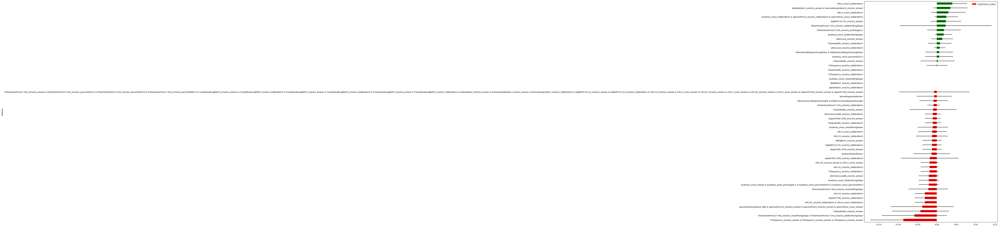

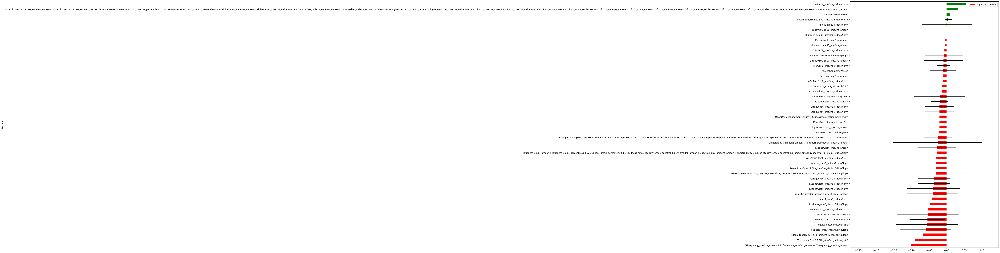

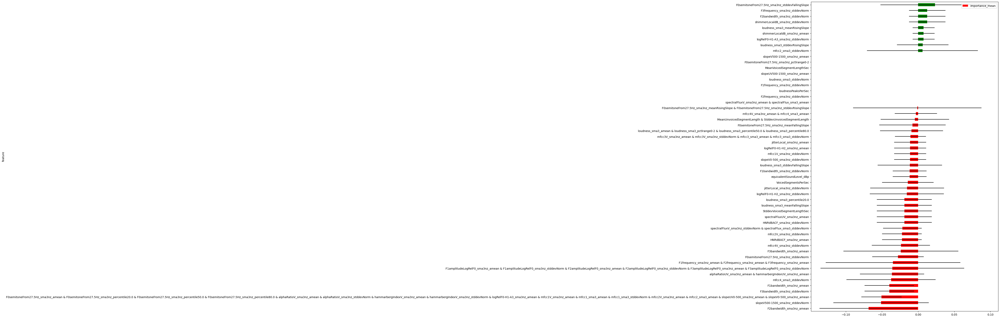

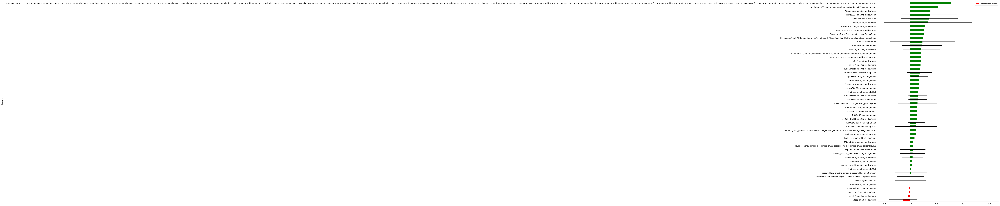

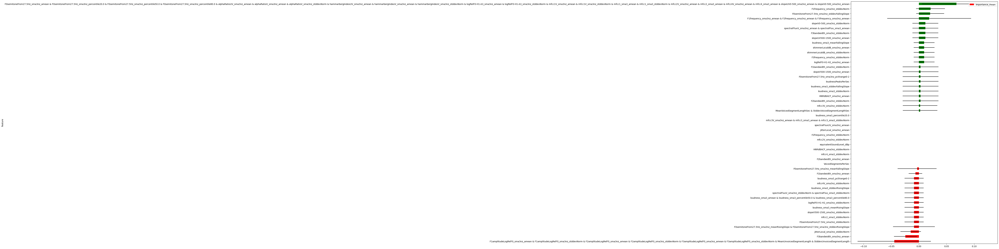

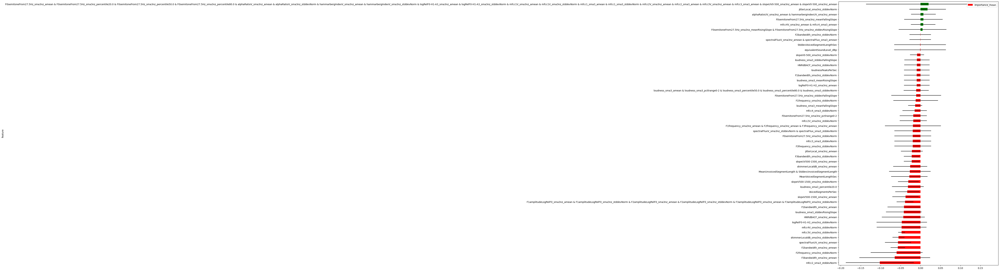

In [16]:

egemaps_fi_dict = {}
egemaps_top_fi_features = {}
egemaps_top_features = {}
lofo_dict = {}
emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

for e in emotions:

  print(e)
  print('---------------------------------------------------------------------')
  print()

  ege_embeddings, ege_labels, ege_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=egemaps_embeddings_dict, speakers_dict=egemaps_speakers_list_dict, num=45)

  trained_model, result = classification_pipeline(embeddings=ege_embeddings, speakers=ege_speakers, labels_list=ege_labels, feature_names=egemaps_feature_names)
  Performance['Egemaps'][e] = result

  fi = feature_importance_method(X=ege_embeddings, y=ege_labels, feature_names=egemaps_feature_names, trained_model=trained_model)
  egemaps_fi_dict[e] = [list(egemaps_feature_names).index(tup[0]) for tup in fi]
  egemaps_top_fi_features[e] = [tup[0] for tup in fi]

  lofo_df = lofo_plot(embeddings_array=ege_embeddings, labels=ege_labels, feature_names=egemaps_feature_names, frac=1.0, e=e, auto_group_threshold=0.8)
  lofo_df.round(3)
  lofo_dict[e] = lofo_df

  # print(fi)
  print()
  print()


## Most important egemaps features (according to LOFO )

In [17]:
df = lofo_dict[emotions[0]].head(10)
df


,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2,val_imp_3,val_imp_4
32,mfcc2_sma3_stddevNorm,0.039700,0.037924,0.000000,0.033333,0.069930,0.000000,0.095238
47,alphaRatioUV_sma3nz_amean & hammarbergIndexUV_...,0.034825,0.044616,0.000000,-0.027273,0.069930,0.036232,0.095238
7,mfcc1_sma3_stddevNorm,0.029744,0.044724,0.000000,0.033333,0.115385,0.000000,0.000000
42,loudness_sma3_stddevNorm & spectralFluxV_sma3n...,0.024263,0.030289,0.000000,0.000000,0.069930,0.051383,0.000000
13,logRelF0-H1-H2_sma3nz_amean,0.023302,0.039481,-0.040936,0.000000,0.069930,0.036232,0.051282
21,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,0.022924,0.117908,-0.152047,0.000000,0.215385,0.000000,0.051282
6,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,0.018500,0.043214,-0.040936,0.000000,0.082051,0.051383,0.000000
35,loudness_sma3_stddevFallingSlope,0.017503,0.021958,0.000000,0.000000,0.000000,0.036232,0.051282
1,jitterLocal_sma3nz_amean,0.013986,0.027972,0.000000,0.000000,0.069930,0.000000,0.000000
11,F1bandwidth_sma3nz_stddevNorm,0.007850,0.030373,-0.040936,0.000000,0.043956,0.036232,0.000000


In [18]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
                                           feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
                             mfcc2\_sma3\_stddevNorm &         0.039700 &        0.037924 &   0.000000 &   0.033333 &   0.069930 &   0.000000 &   0.095238 \\
alphaRatioUV\_sma3nz\_amean \& hammarbergIndexUV\_s... &         0.034825 &        0.044616 &   0.000000 &  -0.027273 &   0.069930 &   0.036232 &   0.095238 \\
                             mfcc1\_sma3\_stddevNorm &         0.029744 &        0.044724 &   0.000000 &   0.033333 &   0.115385 &   0.000000 &   0.000000 \\
loudness\_sma3\_stddevNorm \& spectralFluxV\_sma3nz... &         0.024263 &        0.030289 &   0.000000 &   0.000000 &   0.069930 &   0.051383 &   0.000000 \\
                       logRelF0-H1-H2\_sma3nz\_amean &         0.023302 &        0.039481 &  -0.040936 &   0.000000 &   0.069930 &   0.036232 &   0.0512

In [19]:
df = lofo_dict[emotions[1]].head(10)

In [20]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
                                           feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
                          mfcc2V\_sma3nz\_stddevNorm &         0.053913 &        0.074052 &   0.000000 &  -0.018182 &   0.154412 &   0.000000 &   0.133333 \\
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.033546 &        0.089114 &  -0.133333 &   0.038095 &   0.125000 &   0.090909 &   0.047059 \\
                               loudnessPeaksPerSec &         0.008609 &        0.056021 &   0.000000 &   0.000000 &  -0.080882 &   0.031621 &   0.092308 \\
            F0semitoneFrom27.5Hz\_sma3nz\_stddevNorm &         0.005000 &        0.010000 &   0.000000 &   0.000000 &   0.000000 &   0.000000 &   0.025000 \\
                             mfcc2\_sma3\_stddevNorm &         0.001190 &        0.070413 &  -0.108333 &   0.000000 &   0.000000 &   0.000000 &   0.114286 \\

In [21]:
df = lofo_dict[emotions[2]].head(10)

In [22]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
                                           feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
    F0semitoneFrom27.5Hz\_sma3nz\_stddevFallingSlope &         0.023485 &        0.075500 &   0.142857 &   0.000000 &   0.017857 &  -0.090909 &   0.047619 \\
                     F3frequency\_sma3nz\_stddevNorm &         0.012632 &        0.025263 &   0.000000 &   0.063158 &   0.000000 &   0.000000 &   0.000000 \\
                     F2bandwidth\_sma3nz\_stddevNorm &         0.012632 &        0.025263 &   0.000000 &   0.063158 &   0.000000 &   0.000000 &   0.000000 \\
                  shimmerLocaldB\_sma3nz\_stddevNorm &         0.012632 &        0.025263 &   0.000000 &   0.063158 &   0.000000 &   0.000000 &   0.000000 \\
                     loudness\_sma3\_meanRisingSlope &         0.007619 &        0.015238 &   0.038095 &   0.000000 &   0.000000 &   0.000000 &   0.000000 \

In [23]:
df = lofo_dict[emotions[3]].head(10)

In [24]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
                                           feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.155902 &        0.158959 &   0.398190 &  -0.074303 &   0.131579 &   0.245614 &   0.078431 \\
alphaRatioUV\_sma3nz\_amean \& hammarbergIndexUV\_s... &         0.105331 &        0.144866 &   0.372549 &  -0.068421 &   0.086124 &   0.057971 &   0.078431 \\
                     F3frequency\_sma3nz\_stddevNorm &         0.076438 &        0.109548 &   0.277311 &   0.000000 &   0.086124 &   0.057971 &  -0.039216 \\
                        HNRdBACF\_sma3nz\_stddevNorm &         0.073372 &        0.104251 &   0.277311 &   0.000000 &   0.031579 &   0.057971 &   0.000000 \\
                          equivalentSoundLevel\_dBp &         0.072129 &        0.107548 &   0.277311 &   0.000000 &   0.000000 &   0.083333 &   0.000000

In [25]:
df = lofo_dict[emotions[4]].head(10)

In [26]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
                                           feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.067799 &        0.062432 &   0.075000 &   0.119048 &   0.054945 &  -0.043333 &   0.133333 \\
                     F1frequency\_sma3nz\_stddevNorm &         0.021087 &        0.026069 &   0.000000 &   0.000000 &   0.000000 &   0.047101 &   0.058333 \\
    F0semitoneFrom27.5Hz\_sma3nz\_stddevFallingSlope &         0.020409 &        0.025119 &   0.000000 &   0.000000 &   0.054945 &   0.047101 &   0.000000 \\
F1frequency\_sma3nz\_amean \& F2frequency\_sma3nz\_a... &         0.018611 &        0.075803 &  -0.066176 &   0.000000 &   0.144231 &  -0.043333 &   0.058333 \\
                     slopeV0-500\_sma3nz\_stddevNorm &         0.011667 &        0.023333 &   0.000000 &   0.000000 &   0.000000 &   0.000000 &   0.0583

In [27]:
df = lofo_dict[emotions[5]].head(10)

In [28]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
                                           feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.020194 &        0.156487 &   0.317308 &  -0.122222 &   0.000000 &   0.000000 &  -0.094118 \\
                     jitterLocal\_sma3nz\_stddevNorm &         0.017697 &        0.045736 &   0.091667 &   0.040936 &  -0.044118 &   0.000000 &   0.000000 \\
alphaRatioUV\_sma3nz\_amean \& hammarbergIndexUV\_s... &         0.007415 &        0.030966 &   0.000000 &   0.040936 &   0.039216 &  -0.043077 &   0.000000 \\
      F0semitoneFrom27.5Hz\_sma3nz\_meanFallingSlope &         0.007207 &        0.048250 &  -0.041667 &   0.040936 &   0.080882 &   0.000000 &  -0.044118 \\
            mfcc4V\_sma3nz\_amean \& mfcc4\_sma3\_amean &         0.006717 &        0.030816 &   0.036765 &   0.040936 &  -0.044118 &   0.000000 &   0.00

## Most important egemaps features (according to coef)

In [29]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[0]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,HNRdBACF_sma3nz_amean
1,slopeUV0-500_sma3nz_amean
2,jitterLocal_sma3nz_amean
3,F3bandwidth_sma3nz_amean
4,F3frequency_sma3nz_stddevNorm
5,spectralFlux_sma3_stddevNorm
6,slopeUV500-1500_sma3nz_amean
7,loudness_sma3_stddevNorm
8,mfcc2_sma3_amean
9,alphaRatioV_sma3nz_amean


In [30]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[1]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,F2bandwidth_sma3nz_stddevNorm
1,shimmerLocaldB_sma3nz_stddevNorm
2,mfcc1_sma3_amean
3,loudness_sma3_meanRisingSlope
4,HNRdBACF_sma3nz_stddevNorm
5,logRelF0-H1-A3_sma3nz_stddevNorm
6,mfcc1V_sma3nz_amean
7,loudness_sma3_meanFallingSlope
8,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2
9,StddevUnvoicedSegmentLength


In [31]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[2]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,mfcc1_sma3_amean
1,slopeV500-1500_sma3nz_amean
2,F1frequency_sma3nz_amean
3,mfcc3_sma3_amean
4,StddevUnvoicedSegmentLength
5,logRelF0-H1-H2_sma3nz_amean
6,mfcc3V_sma3nz_amean
7,mfcc1V_sma3nz_amean
8,MeanUnvoicedSegmentLength
9,F0semitoneFrom27.5Hz_sma3nz_percentile20.0


In [32]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[3]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2
1,mfcc3_sma3_amean
2,mfcc3V_sma3nz_amean
3,F0semitoneFrom27.5Hz_sma3nz_percentile80.0
4,loudness_sma3_meanRisingSlope
5,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope
6,mfcc3V_sma3nz_stddevNorm
7,MeanUnvoicedSegmentLength
8,F0semitoneFrom27.5Hz_sma3nz_percentile50.0
9,F0semitoneFrom27.5Hz_sma3nz_stddevNorm


In [33]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[4]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,hammarbergIndexV_sma3nz_amean
1,StddevUnvoicedSegmentLength
2,alphaRatioV_sma3nz_amean
3,slopeV0-500_sma3nz_amean
4,MeanUnvoicedSegmentLength
5,slopeUV0-500_sma3nz_amean
6,F3frequency_sma3nz_amean
7,F1amplitudeLogRelF0_sma3nz_stddevNorm
8,VoicedSegmentsPerSec
9,loudness_sma3_amean


In [34]:
data = {'egemaps feature names': egemaps_top_fi_features[emotions[5]]}
df = pd.DataFrame(data)
df.head(10)

,egemaps feature names
0,F1frequency_sma3nz_stddevNorm
1,slopeV0-500_sma3nz_amean
2,slopeV500-1500_sma3nz_amean
3,F1bandwidth_sma3nz_amean
4,logRelF0-H1-H2_sma3nz_stddevNorm
5,mfcc4_sma3_stddevNorm
6,mfcc4_sma3_amean
7,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2
8,loudnessPeaksPerSec
9,logRelF0-H1-A3_sma3nz_amean


In [35]:
def find_x_at_n_percentile(x_values, y_values, n):
    percentile = np.percentile(y_values, n)
    for i, y in enumerate(y_values):
        if y >= percentile:
            x_at_nth_percentile = x_values[i]
            break

    return x_at_nth_percentile

# Hybrid BYOLS

In [36]:
byols_embeddings_dict, byols_labels_dict, byols_speakers_list_dict = label_division(embeddings_array=embeddings_array_byols, labels=labels, required_labels=['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust'], speakers=speakers)


In [37]:
print(byols_embeddings_dict)
# print(byols_labels_dict)
# print(byols_speakers_list_dict)

{'anger': tensor([[ 4.8295,  3.4303,  1.4084,  ...,  4.3034,  0.0836,  2.9137],
        [ 4.9785,  4.8262,  1.2357,  ...,  7.0374,  0.1045,  3.7526],
        [ 6.2760,  3.4870,  1.2823,  ...,  3.8843, -1.1824,  3.0299],
        ...,
        [ 7.1214,  5.1989,  1.4818,  ...,  4.4050, -1.1962,  3.6922],
        [ 6.2196,  3.1066,  1.3785,  ...,  4.3994, -0.7459,  3.5010],
        [ 7.1199,  4.1427,  2.1136,  ...,  5.0891, -0.7600,  2.3897]]), 'fear': tensor([[ 6.0395,  4.7411,  0.8721,  ...,  5.1916, -0.6065,  3.3685],
        [ 4.5785,  4.5681,  1.4435,  ...,  4.5271,  0.0154,  3.7138],
        [ 6.2309,  3.9772,  1.4060,  ...,  4.3777,  1.1665,  2.7751],
        ...,
        [ 4.2367,  3.6951,  0.0411,  ...,  5.3873,  2.0555,  3.5505],
        [ 5.3290,  5.3535,  0.4736,  ...,  6.6963,  0.6004,  3.0500],
        [ 6.4874,  3.3676,  1.6190,  ...,  4.6027, -0.8638,  3.9331]]), 'neutral': tensor([[ 4.4260,  7.5846,  1.0399,  ...,  4.2329, -1.5589,  3.8098],
        [ 3.0755,  4.1871, -0.4

In [38]:
def corr_triu(embeddings, e):
    df = pd.DataFrame(embeddings)
    correlations_emotion_i = np.triu(df.corr('spearman').values)
    correlations_filtered = [value for row in correlations_emotion_i for value in row if abs(value) > 0.5]

    plt.hist(correlations_filtered, bins=100)
    plt.title(f'{e} \nMean: {np.mean(correlations_filtered)}\nMedian: {np.median(correlations_filtered)}')
    plt.xlabel('Correlation Value')
    plt.ylabel('Frequency')
    plt.show()

anger
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['1020', '1028', '1049', '1056', '1076', '111', '1162', '1288', '1296', '1341', '1372', '144', '1464', '150', '152', '159', '1646', '169', '1766', '1924', '193', '1940', '197', '247', '27', '273', '287', '30', '305', '317', '348', '373', '383', '385', '391', '396', '42', '44', '443', '447', '482', '488', '500', '51', '544', '575', '584', '590', '613', '643', '652', '762', '88', '917', '937']
2 ['478', '64']
3 ['132', '431']
4 ['296', '428']
5 ['358', '476']
6 ['1224', '1447', '1736', '1959', '712', '935']
7 ['1302', '790']
8 ['1311', '1823', '799']
9 ['1440', '928']
10 ['1459', '1971', '947']
11 ['1212', '1293']
12 ['1260', '1772']
13 ['1384', '1896']
14 ['1415', '1927']


  0%|          | 0/1975 [00:00<?, ?it/s]



fear
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['0', '1076', '111', '1162', '1372', '140', '144', '159', '177', '207', '27', '30', '313', '317', '375', '38', '447', '452', '500', '508', '516', '575', '584', '590', '63', '643', '652', '700', '78', '860', '88', '937']
2 ['276', '358', '476', '55']
3 ['193', '383']
4 ['348', '482']
5 ['1098', '586']
6 ['1169', '657']
7 ['1224', '1736', '712']
8 ['1311', '1823', '799']
9 ['1384', '1896', '872']
10 ['1440', '928']
11 ['1447', '1959', '935']
12 ['1459', '1971', '947']
13 ['1507', '995']
14 ['1051', '1399']
15 ['1212', '1293']
16 ['1381', '1893']
17 ['1415', '1927']


  0%|          | 0/1994 [00:00<?, ?it/s]



neutral
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['138', '146', '188', '196', '269', '4', '497', '68', '72']
2 ['111', '125', '1372', '140', '144', '152', '27', '280', '30', '313', '317', '375', '38', '447', '449', '452', '500', '508', '516', '584', '590', '63', '652', '764', '78', '781', '860', '88']
3 ['1162', '177']
4 ['391', '396']
5 ['1169', '1459', '1681', '1971', '657']
6 ['1224', '1736', '712']
7 ['1311', '799']
8 ['1415', '1927', '903']
9 ['1447', '935']
10 ['1051', '1399']
11 ['1312', '1315']


  0%|          | 0/1999 [00:00<?, ?it/s]



happiness
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['0', '78']
2 ['1020', '1028', '1076', '111', '1162', '1372', '144', '1464', '159', '197', '247', '27', '30', '300', '317', '373', '375', '42', '500', '575', '590', '643', '652', '688', '700', '88']
3 ['478', '64']
4 ['313', '447']
5 ['348', '482']
6 ['391', '396']
7 ['516', '860']
8 ['1098', '586']
9 ['1169', '657', '903']
10 ['1224', '1447', '1736', '712', '935']
11 ['1260', '748']
12 ['1384', '872']
13 ['1459', '947']
14 ['1415', '1927']
15 ['1766', '1924']


  0%|          | 0/2005 [00:00<?, ?it/s]



sadness
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['1169', '1224', '125', '131', '133', '140', '1437', '144', '1447', '1459', '146', '1496', '151', '1675', '1681', '169', '1729', '1736', '174', '177', '1918', '1940', '1959', '1971', '200', '248', '26', '27', '276', '278', '280', '293', '30', '305', '313', '317', '35', '350', '358', '370', '38', '391', '396', '413', '422', '423', '447', '449', '452', '476', '478', '480', '488', '500', '501', '503', '506', '508', '516', '584', '590', '612', '63', '64', '652', '68', '700', '712', '72', '78', '790', '860', '903', '925', '935', '947']
2 ['254', '766']
3 ['1039', '527']
4 ['539', '887']
5 ['1260', '1772', '748']
6 ['1311', '1823', '799']
7 ['1056', '1568']
8 ['1212', '1293']
9 ['1415', '1927']
10 ['1605', '1893']


  0%|          | 0/1962 [00:00<?, ?it/s]



disgust
---------------------------------------------------------------------

Automatically grouped features by correlation:
1 ['1076', '1162', '1372', '140', '144', '159', '27', '30', '313', '317', '38', '447', '500', '508', '516', '575', '584', '590', '63', '643', '652', '78', '860', '88']
2 ['193', '385']
3 ['348', '482']
4 ['1020', '373']
5 ['1224', '1736', '712']
6 ['1260', '1772', '748']
7 ['1311', '1823', '799']
8 ['1384', '1896', '872']
9 ['1447', '935']
10 ['1212', '1293']
11 ['1376', '1888']
12 ['1415', '1927']
13 ['1555', '1590']


  0%|          | 0/2009 [00:00<?, ?it/s]

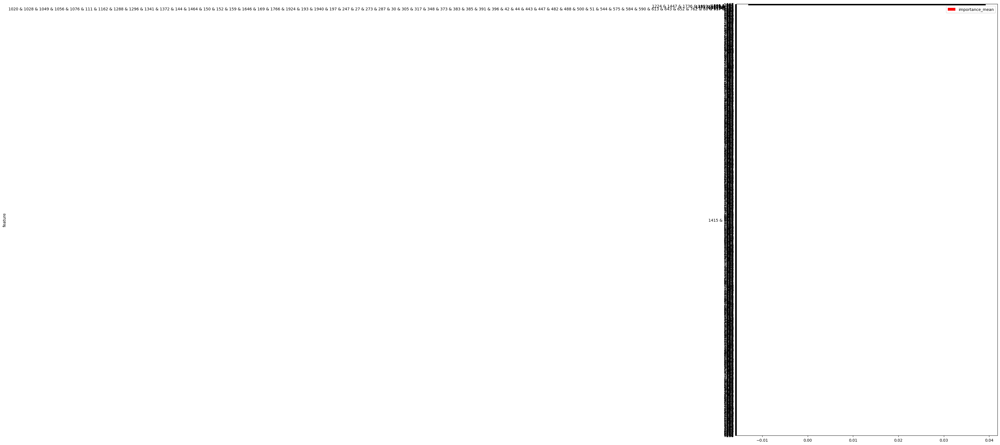

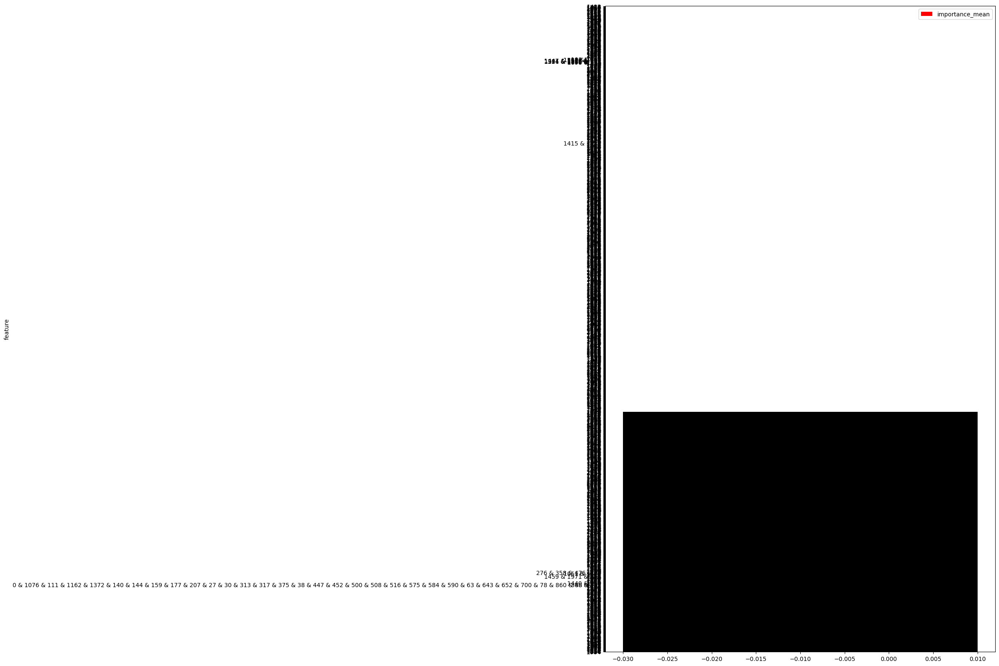

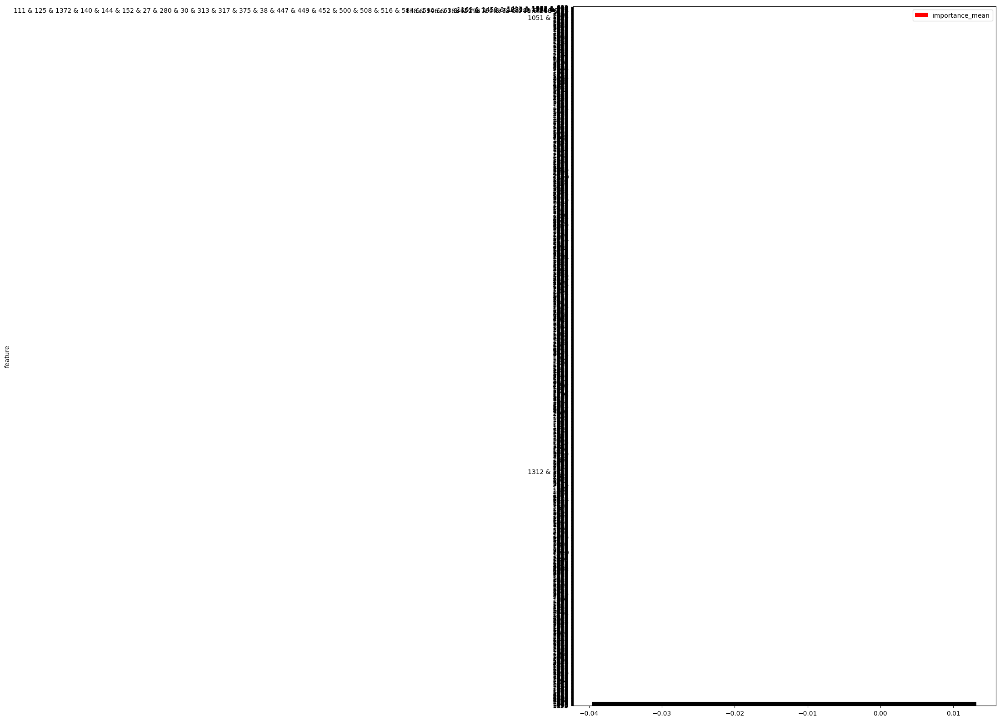

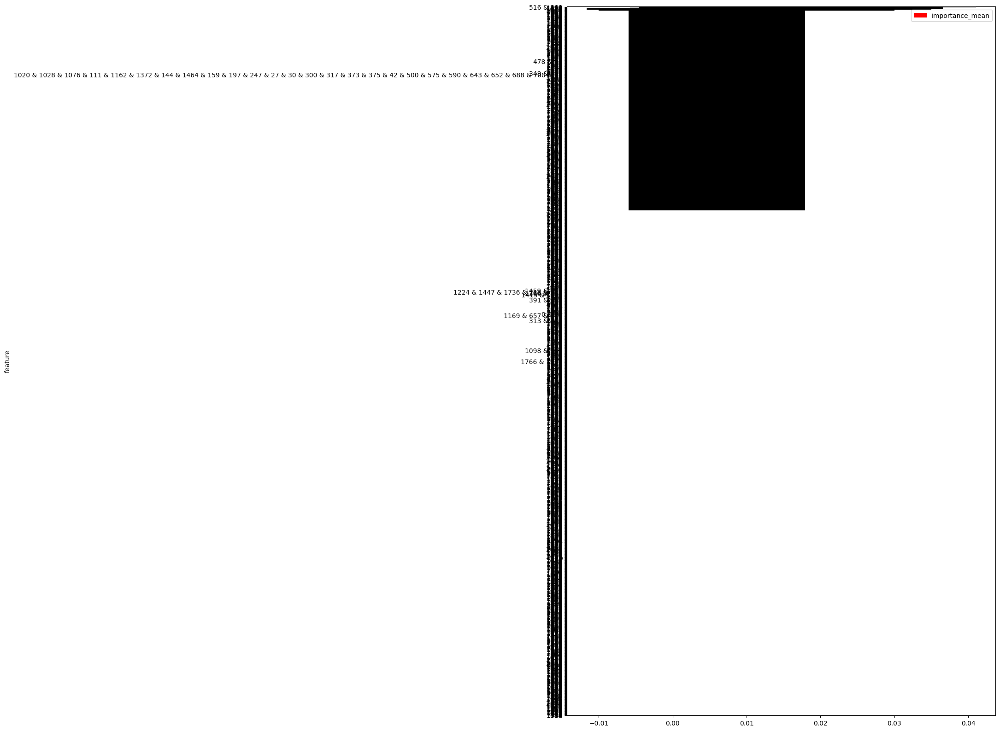

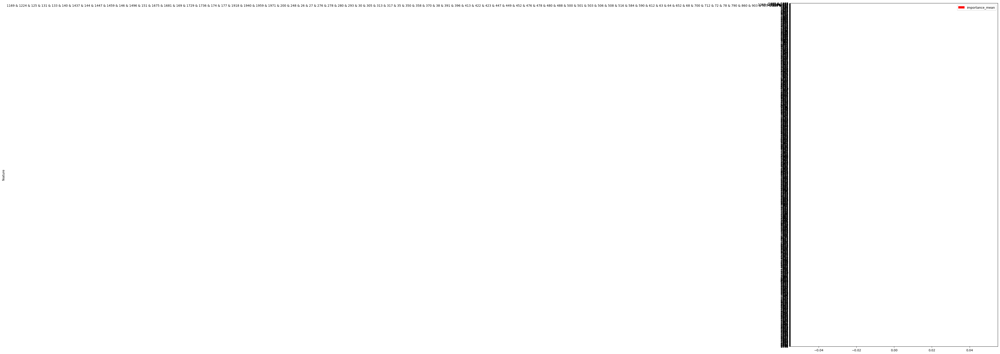

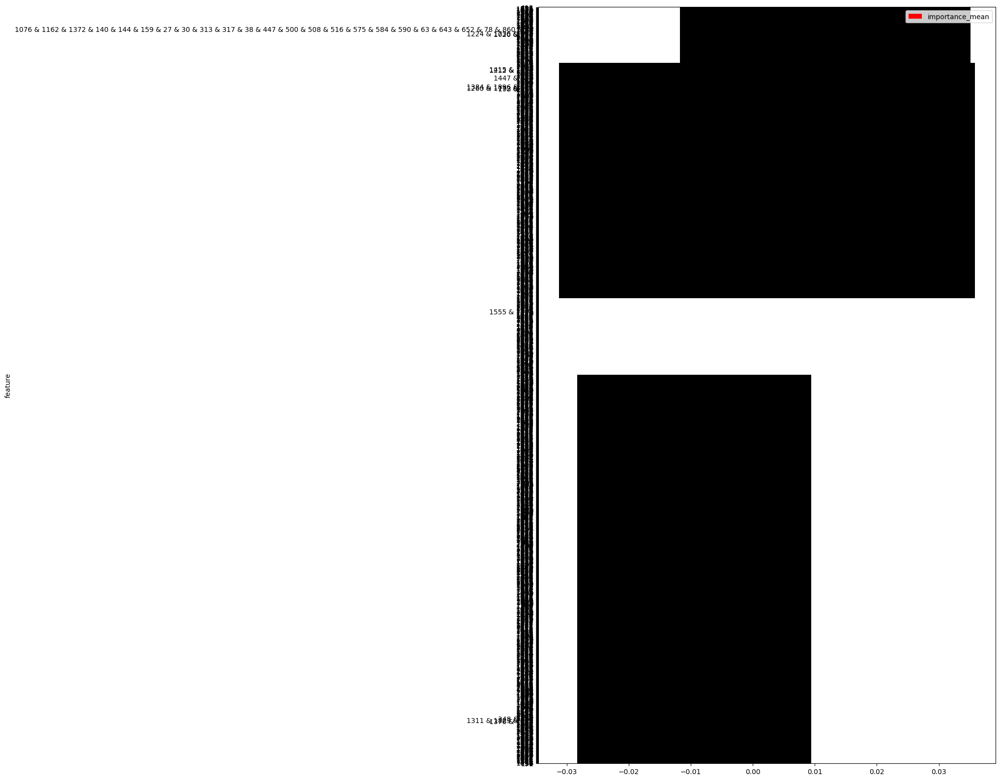

In [39]:
byols_feature_names = [i for i in range(2048)]
byols_str_feature_names = [str(i) for i in range(2048)]

byols_fi_dict = {}
lofo_dict_byols = {}

emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

for e in emotions:

  print(e)
  print('---------------------------------------------------------------------')
  print()

  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)

  trained_model, result = classification_pipeline(embeddings=byols_embeddings, speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
  Performance['Hybrid_Byols_2048'][e] = result

  fi = feature_importance_method(X=byols_embeddings, y=byols_labels, feature_names=byols_feature_names, trained_model=trained_model)
  byols_fi_dict[e] = [tup[0] for tup in fi]


  # print(byols_embeddings.shape)
  # print(byols_labels)
  # print(byols_str_feature_names)

  lofo_df = lofo_plot(embeddings_array=byols_embeddings, labels=byols_labels, feature_names=byols_str_feature_names, frac=1.0, e=e, auto_group_threshold=0.8)
  lofo_df.round(3)
  lofo_dict_byols[e] = lofo_df

  # corr_triu(embeddings = byols_embeddings, e=e)

  # print(fi)
  print()
  print()

In [40]:
df = lofo_dict_byols[emotions[0]].head(10)

In [41]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
    667 &         0.013072 &        0.026144 &   0.065359 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1648 &         0.013072 &        0.026144 &   0.065359 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1194 &         0.013072 &        0.026144 &   0.065359 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1403 &         0.013072 &        0.026144 &   0.065359 &        0.0 &        0.0 &        0.0 &        0.0 \\
    594 &         0.013072 &        0.026144 &   0.065359 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1193 &         0.000000 &        0.000000 &   0.000000 &        0.0 &        0.0 &        0.0 &        0.0 \\
    742 &         0.000000 &        0.000000 &   0.000000 &        0.0 &        0.0 &        0.0 &        0.0 \\
    234 &         0.000000 &        0.00

In [42]:
df = lofo_dict_byols[emotions[1]].head(10)

In [43]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
   1535 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1755 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1759 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1708 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1679 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1849 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
    246 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
    309 &              0.0 &            

In [44]:
df = lofo_dict_byols[emotions[2]].head(10)

In [45]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
   1535 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1886 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1843 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1062 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1193 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
    742 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
    234 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1251 &              0.0 &            

In [46]:
df = lofo_dict_byols[emotions[3]].head(10)

In [47]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
  feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
516 \& 860 &         0.017644 &        0.023407 &       0.00 &        0.0 &        0.0 &   0.029885 &   0.058333 \\
     1499 &         0.015977 &        0.020576 &       0.05 &        0.0 &        0.0 &   0.029885 &   0.000000 \\
     1658 &         0.015977 &        0.020576 &       0.05 &        0.0 &        0.0 &   0.029885 &   0.000000 \\
     1422 &         0.015977 &        0.020576 &       0.05 &        0.0 &        0.0 &   0.029885 &   0.000000 \\
     1856 &         0.015977 &        0.020576 &       0.05 &        0.0 &        0.0 &   0.029885 &   0.000000 \\
     1425 &         0.015977 &        0.020576 &       0.05 &        0.0 &        0.0 &   0.029885 &   0.000000 \\
      742 &         0.011667 &        0.023333 &       0.00 &        0.0 &        0.0 &   0.000000 &   0.058333 \\
      546 &         0.0

In [48]:
df = lofo_dict_byols[emotions[4]].head(10)

In [49]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
   1535 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1416 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1843 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1062 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1193 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
    742 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
    234 &              0.0 &             0.0 &        0.0 &        0.0 &        0.0 &        0.0 &        0.0 \\
   1251 &              0.0 &            

In [50]:
df = lofo_dict_byols[emotions[5]].head(10)

In [51]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrr}
\toprule
feature &  importance\_mean &  importance\_std &  val\_imp\_0 &  val\_imp\_1 &  val\_imp\_2 &  val\_imp\_3 &  val\_imp\_4 \\
\midrule
    495 &         0.011696 &        0.023392 &        0.0 &    0.05848 &        0.0 &        0.0 &        0.0 \\
    693 &         0.011696 &        0.023392 &        0.0 &    0.05848 &        0.0 &        0.0 &        0.0 \\
    307 &         0.011696 &        0.023392 &        0.0 &    0.05848 &        0.0 &        0.0 &        0.0 \\
   1449 &         0.011696 &        0.023392 &        0.0 &    0.05848 &        0.0 &        0.0 &        0.0 \\
    616 &         0.011696 &        0.023392 &        0.0 &    0.05848 &        0.0 &        0.0 &        0.0 \\
    464 &         0.011696 &        0.023392 &        0.0 &    0.05848 &        0.0 &        0.0 &        0.0 \\
   1483 &         0.011696 &        0.023392 &        0.0 &    0.05848 &        0.0 &        0.0 &        0.0 \\
    131 &         0.011696 &        0.02

# Percentile

In [52]:
num_byols_features = {e: 1 for e in emotions}

def plot_top_performance(e, importance_dict):
  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)
  top_scores = []
  bottom_scores = []
  rest_scores = []

  for n in range(10, 1024, 10):

    top_features = importance_dict[e][:n]
    best_model, top_f1 = classification_pipeline(embeddings=byols_embeddings[:, top_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    top_scores.append(top_f1)

    rest_features = importance_dict[e][n+1:]
    best_model, rest_f1 = classification_pipeline(embeddings=byols_embeddings[:, rest_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    rest_scores.append(rest_f1)

    bottom_features = importance_dict[e][2048-n-1:]
    best_model, bottom_f1 = classification_pipeline(embeddings=byols_embeddings[:, bottom_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    bottom_scores.append(bottom_f1)

  n_features = range(10, 1024, 10)
  fig, ax = plt.subplots()

  ax.plot(n_features, top_scores, label='Top dimensions')
  ax.plot(n_features, rest_scores, label='Rest dimensions')
  ax.plot(n_features, bottom_scores, label='Bottom dimensions')

  ax.set_xlabel('Number of dimensions')
  ax.set_ylabel('F1 score')
  ax.set_title(e)
  ax.legend()

  percentile = np.percentile(top_scores, 100)
  # ax.axhline(y=percentile, color='r')

  ax.set_ylim(0, 1)
  x_val = find_x_at_n_percentile(n_features, top_scores, 100)
  ax.scatter(x_val, percentile, marker='x', color='red')

  return x_val, percentile



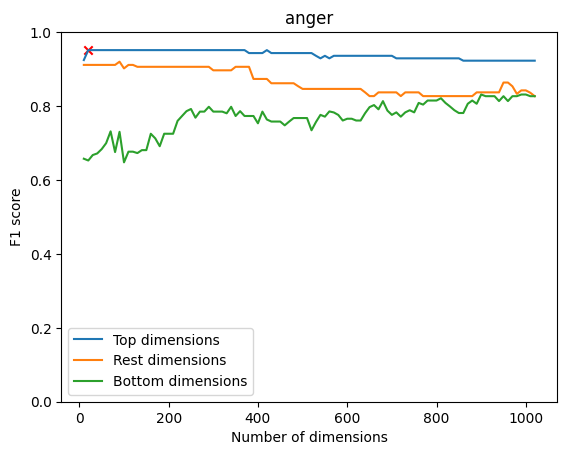

In [53]:
emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

num_byols_features[emotions[0]], Performance['Hybrid_Byols_top_features'][emotions[0]] = plot_top_performance(emotions[0], byols_fi_dict)


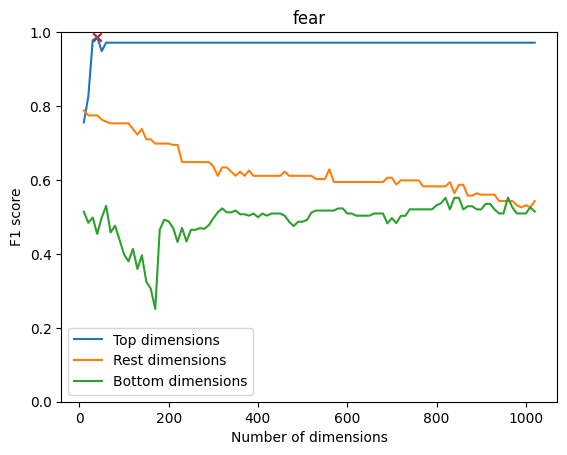

In [54]:

num_byols_features[emotions[1]], Performance['Hybrid_Byols_top_features'][emotions[1]]  = plot_top_performance(emotions[1], byols_fi_dict)


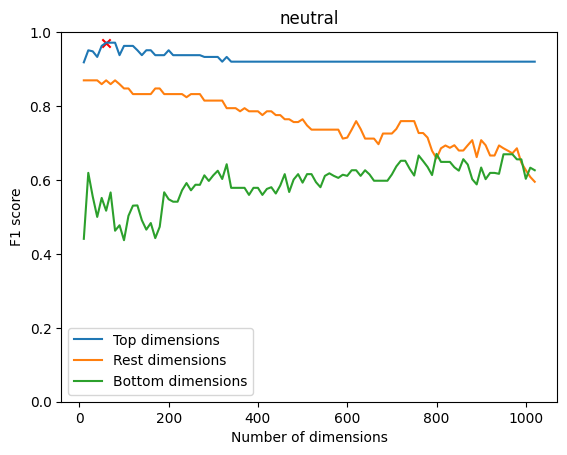

In [55]:

num_byols_features[emotions[2]], Performance['Hybrid_Byols_top_features'][emotions[2]] = plot_top_performance(emotions[2], byols_fi_dict)


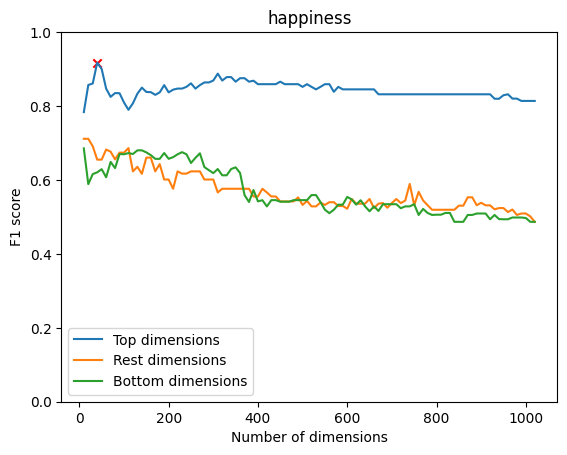

In [56]:

num_byols_features[emotions[3]], Performance['Hybrid_Byols_top_features'][emotions[3]] = plot_top_performance(emotions[3], byols_fi_dict)


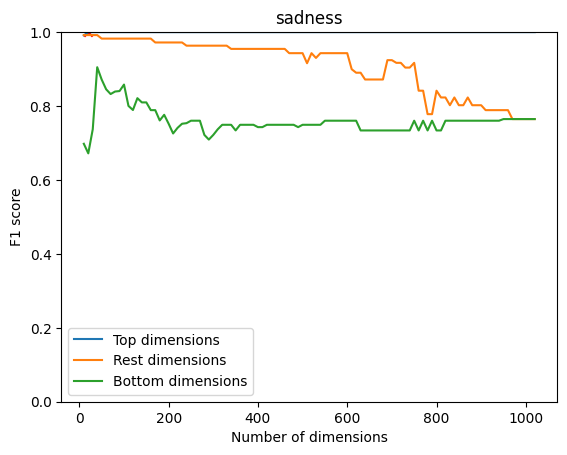

In [57]:

num_byols_features[emotions[4]], Performance['Hybrid_Byols_top_features'][emotions[4]] = plot_top_performance(emotions[4], byols_fi_dict)


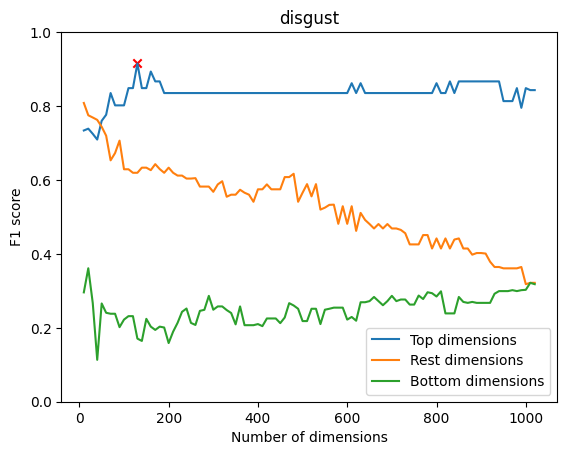

In [58]:

num_byols_features[emotions[5]], Performance['Hybrid_Byols_top_features'][emotions[5]] = plot_top_performance(emotions[5], byols_fi_dict)


In [59]:
print(num_byols_features)


{'anger': 20, 'fear': 40, 'neutral': 60, 'happiness': 40, 'sadness': 20, 'disgust': 130}


# LOFO Percentile

In [60]:
lofo_num_byols_features = {e: 1 for e in emotions}

def plot_top_performance_lofo(e):
  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)

  top_scores = []
  rest_scores = []

  feats_array = []
  x_vals = []
  x_val = 0

  for num in range(0, 1024, 10):

    for feature_set in lofo_dict_byols[e]['feature'][num:num+10]:
      new_feats = [int(f) for f in feature_set.split(' & ')]
      feats_array.extend(new_feats)

    x_val = len(feats_array)
    x_vals.append(x_val)

    # print(feats_array)
    # print(x_vals)

    top_features = feats_array
    best_model, top_f1 = classification_pipeline(embeddings=byols_embeddings[:, top_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    top_scores.append(top_f1)

    rest_features = [f for f in range(2048) if f not in feats_array]
    best_model, rest_f1 = classification_pipeline(embeddings=byols_embeddings[:, rest_features], speakers=byols_speakers, labels_list=byols_labels, feature_names=byols_feature_names)
    rest_scores.append(rest_f1)

  n_features = x_vals
  fig, ax = plt.subplots()

  ax.plot(n_features, top_scores, label='Top embeddings')
  ax.plot(n_features, rest_scores, label='Rest embeddings')

  ax.set_xlabel('Amount of top embeddings')
  ax.set_ylabel('F1 score')
  ax.set_title(e)
  ax.legend()

  percentile = np.percentile(top_scores, 100)

  ax.set_ylim(0, 1)
  x_val = find_x_at_n_percentile(n_features, top_scores, 100)
  ax.scatter(x_val, percentile, marker='x', color='red')
  lofo_num_byols_features[e] = x_val

  return x_val, percentile



(410, 0.9714285714285715)

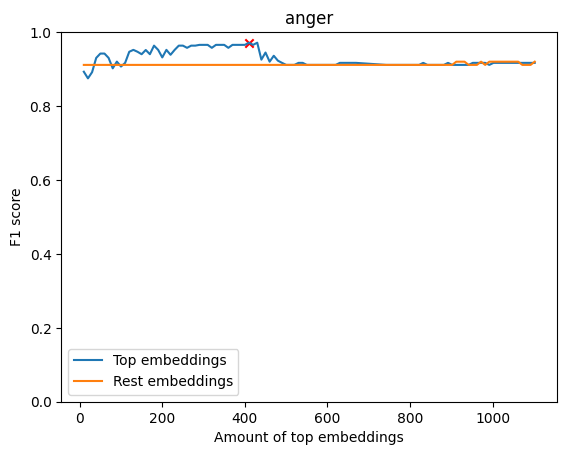

In [61]:
emotions = ['anger', 'fear', 'neutral', 'happiness', 'sadness', 'disgust']

plot_top_performance_lofo(emotions[0])


(420, 0.9492063492063492)

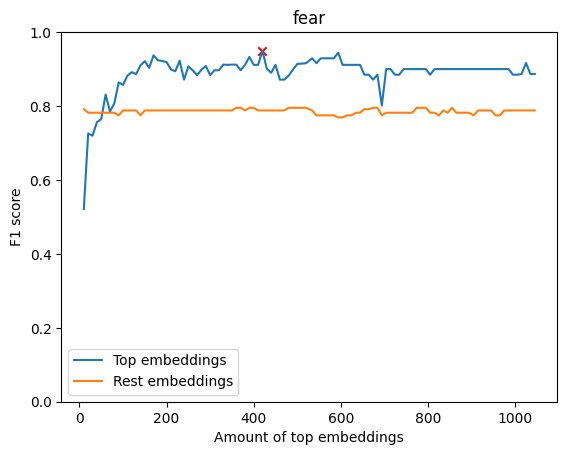

In [62]:

plot_top_performance_lofo(emotions[1])


(170, 0.9414285714285713)

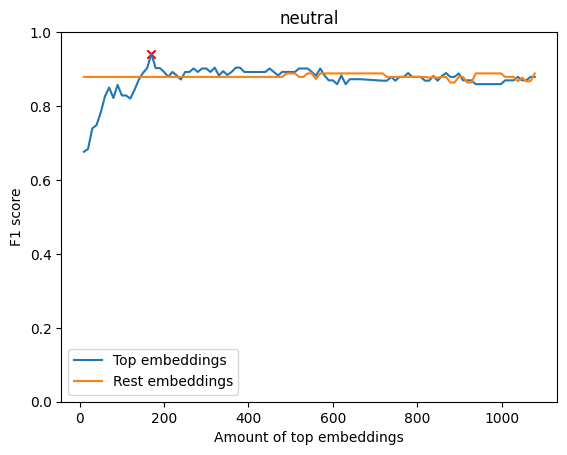

In [63]:

plot_top_performance_lofo(emotions[2])


(411, 0.9201464530892449)

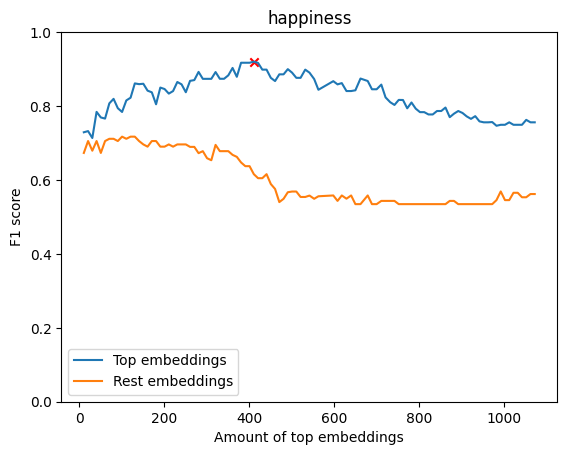

In [64]:

plot_top_performance_lofo(emotions[3])


(310, 1.0)

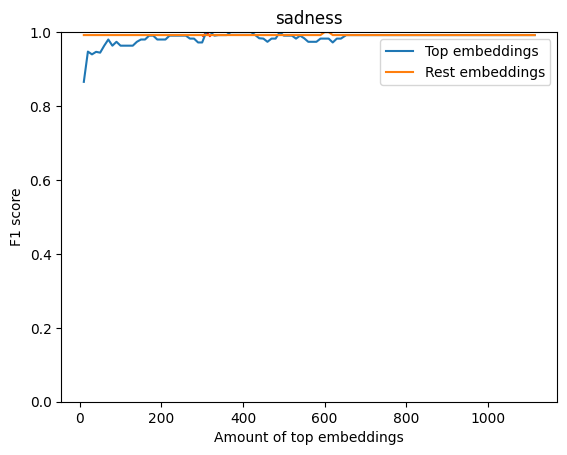

In [65]:

plot_top_performance_lofo(emotions[4])


(1015, 0.748795518207283)

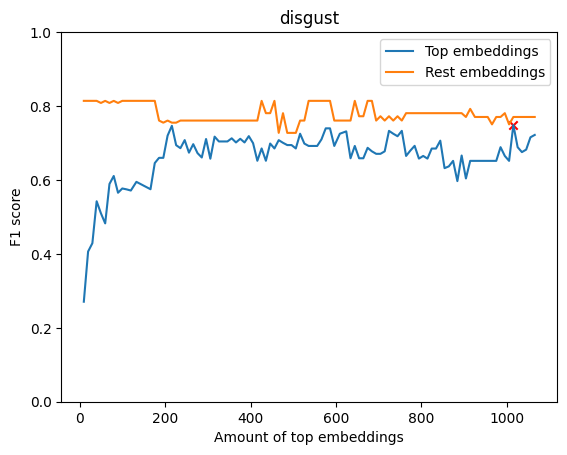

In [66]:

plot_top_performance_lofo(emotions[5])


In [67]:
print(lofo_num_byols_features)


{'anger': 410, 'fear': 420, 'neutral': 170, 'happiness': 411, 'sadness': 310, 'disgust': 1015}


# Predicting Functions

In [68]:
# Defining a function for all steps
from sklearn.linear_model import Ridge

def prediction_pipeline(labeled_array, labels_list, regression_model, scoring='neg_root_mean_squared_error'):

  # Train Test Splitting
  X_train, X_test, y_train, y_test = train_test_split(
      labeled_array, labels_list, test_size=0.20)

  # Getting hyperparameters
  # change model to ridge + parameter is alpha

  if regression_model == 'linreg':
    classifier = LinearRegression(fit_intercept=True)
    parameters = {} # update
    result = get_hyperparams(X_train, X_test, y_train, y_test, regressor, parameters, scoring=scoring)

  elif regression_model == 'elasticnet':
    regressor = ElasticNet()
    parameters = {'model__alpha': [0, 0.5, 1], 'model__l1_ratio': np.arange(0,1.1,0.1)}
    result, p = get_hyperparams(X_train, X_test, y_train, y_test, regressor, parameters, scoring=scoring)

  elif regression_model == 'ridge':
    regressor = Ridge()
    parameters = {'model__alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
    result, p = get_hyperparams(X_train, X_test, y_train, y_test, regressor, parameters, scoring=scoring)

  return result, p


In [69]:

# Defining a function for hyperparameter tuning and getting the accuracy on the test set
def get_hyperparams(X_train, X_test, y_train, y_test, regressor, parameters, scoring='neg_mean_squared_error'): # check scoring
  '''
  Splits into training and testing set with different speakers

  Parameters
  ------------
  X_train: torch tensor
    The normalised embeddings that will be used for training
  X_test: torch tensor
    The normalised embeddings that will be used for testing
  y_train: list
    The labels that will be used for training
  y_test: list
    The labels that will be used for testing
  classifier: object
    The instance of the classification model
  parameters: dictionary
    The dictionary of parameters for GridSearchCV

  Returns
  ------------
    The dictionary of the best hyperparameters

  '''

  # Define the pipeline
  pipe = Pipeline([
          ('scaler', StandardScaler()),
          ('model', regressor)
      ])

  grid = GridSearchCV(pipe, param_grid=parameters, cv=5, n_jobs=-1, scoring=scoring)
  grid.fit(X_train, y_train)

  y_pred = grid.predict(X_test)
  r_squared = r2_score(y_test, y_pred)
  pearson_correlation = np.corrcoef(y_test, y_pred)[0, 1]

  return r_squared, pearson_correlation

In [70]:


# def color_bar_plot(y, sort=True):
#   x = egemaps_feature_names
#   y = y

#   sns.set(rc={'figure.figsize':(20,8)})
#   if sort==True:
#     sorted_idx = sorted(range(len(x)), key=lambda k: y[k])
#     x = [x[i] for i in sorted_idx]
#     y = [y[i] for i in sorted_idx]
#     ax = sns.set(rc={'figure.figsize':(20,8)})
#   bar_color = "gray"
#   ax = sns.barplot(x=x, y=y, color=bar_color)
#   tick_labels = plt.xticks()[1]
#   for i in range(len(tick_labels)):
#     tick_label = tick_labels[i].get_text()
#     plt.xticks(rotation=90, ha='center')
#     plt.setp(tick_labels[i], color=egemaps_category_dict[tick_label])

#   data = {'egemaps feature names': x, 'R2': y}
#   df = pd.DataFrame(data)
#   df = df.iloc[::-1]
#   return df

# Getting performance for top features

In [71]:
predicted_df_dict = {}

def top_byols_predict_ege(e):

  en_errors_r_squared_top = []
  en_errors_r_squared_all = []
  pearson_corr_top = []
  pearson_corr_all = []

  byols_embeddings, byols_labels, byols_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=byols_embeddings_dict, speakers_dict=byols_speakers_list_dict, num=45)
  ege_embeddings, ege_labels, ege_speakers = emotion_all_merger(emotion=e, other_emotions=[em for em in emotions if em!=e], embeddings_dict=egemaps_embeddings_dict, speakers_dict=egemaps_speakers_list_dict, num=45)

  top_features = byols_fi_dict[e][:num_byols_features[e]]
  all_features = byols_fi_dict[e][:]


  for i in tqdm(range(88)):

    en_r_squared_top, p_corr_top = prediction_pipeline(byols_embeddings[:, top_features], ege_embeddings[:,i], regression_model='ridge')
    en_errors_r_squared_top.append(np.round(en_r_squared_top, 3))
    pearson_corr_top.append(np.round(p_corr_top, 3))

    en_r_squared_all, p_corr_all = prediction_pipeline(byols_embeddings[:, all_features], ege_embeddings[:,i], regression_model='ridge')
    en_errors_r_squared_all.append(np.round(en_r_squared_all, 3))
    pearson_corr_all.append(np.round(p_corr_all, 3))

  prediction_metrics_dict = {'features':egemaps_feature_names, 'pearson top':pearson_corr_top, 'R2 top':en_errors_r_squared_top, 'pearson all': pearson_corr_all, 'R2 all':en_errors_r_squared_all}

  return prediction_metrics_dict


In [72]:
df = pd.DataFrame(top_byols_predict_ege(emotions[0]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[0]] = sorted_df


100%|██████████| 88/88 [00:36<00:00,  2.39it/s]


In [73]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
62,slopeV0-500_sma3nz_amean,0.896,0.790,0.989,0.955
2,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.887,0.763,0.953,0.886
58,alphaRatioV_sma3nz_amean,0.872,0.755,0.845,0.692
70,mfcc2V_sma3nz_amean,0.855,0.724,0.954,0.892
56,F3amplitudeLogRelF0_sma3nz_amean,0.816,0.653,0.939,0.873
4,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0.811,0.644,0.977,0.949
38,logRelF0-H1-A3_sma3nz_amean,0.818,0.636,0.932,0.840
3,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0.793,0.623,0.959,0.915
60,hammarbergIndexV_sma3nz_amean,0.848,0.614,0.967,0.910
50,F2amplitudeLogRelF0_sma3nz_amean,0.795,0.572,0.944,0.846


In [74]:
df = pd.DataFrame(top_byols_predict_ege(emotions[1]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[1]] = sorted_df


100%|██████████| 88/88 [00:33<00:00,  2.65it/s]


In [75]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
0,F0semitoneFrom27.5Hz_sma3nz_amean,0.867,0.718,0.972,0.933
4,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0.863,0.701,0.972,0.944
22,mfcc1_sma3_amean,0.865,0.689,0.877,0.760
68,mfcc1V_sma3nz_amean,0.850,0.657,0.919,0.842
3,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0.788,0.600,0.975,0.947
2,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.817,0.596,0.971,0.942
62,slopeV0-500_sma3nz_amean,0.773,0.579,0.962,0.923
70,mfcc2V_sma3nz_amean,0.854,0.566,0.898,0.773
60,hammarbergIndexV_sma3nz_amean,0.766,0.553,0.891,0.765
12,loudness_sma3_percentile20.0,0.759,0.547,0.916,0.766


In [76]:
df = pd.DataFrame(top_byols_predict_ege(emotions[2]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[2]] = sorted_df


100%|██████████| 88/88 [00:34<00:00,  2.58it/s]


In [77]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
2,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.912,0.826,0.958,0.908
4,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0.910,0.814,0.968,0.920
3,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0.867,0.730,0.991,0.980
0,F0semitoneFrom27.5Hz_sma3nz_amean,0.898,0.720,0.987,0.959
34,HNRdBACF_sma3nz_amean,0.890,0.707,0.952,0.903
60,hammarbergIndexV_sma3nz_amean,0.848,0.677,0.936,0.876
68,mfcc1V_sma3nz_amean,0.834,0.668,0.957,0.855
22,mfcc1_sma3_amean,0.822,0.586,0.928,0.852
62,slopeV0-500_sma3nz_amean,0.842,0.582,0.962,0.904
24,mfcc2_sma3_amean,0.764,0.575,0.967,0.907


In [78]:
df = pd.DataFrame(top_byols_predict_ege(emotions[3]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[3]] = sorted_df


100%|██████████| 88/88 [00:33<00:00,  2.60it/s]


In [79]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
4,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0.915,0.831,0.973,0.934
0,F0semitoneFrom27.5Hz_sma3nz_amean,0.890,0.727,0.980,0.951
74,mfcc4V_sma3nz_amean,0.799,0.608,0.941,0.855
60,hammarbergIndexV_sma3nz_amean,0.837,0.548,0.905,0.734
86,StddevUnvoicedSegmentLength,0.747,0.545,0.929,0.856
56,F3amplitudeLogRelF0_sma3nz_amean,0.746,0.502,0.930,0.846
34,HNRdBACF_sma3nz_amean,0.742,0.489,0.894,0.789
32,shimmerLocaldB_sma3nz_amean,0.828,0.486,0.859,0.636
2,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.779,0.476,0.972,0.919
40,F1frequency_sma3nz_amean,0.774,0.450,0.851,0.683


In [80]:
df = pd.DataFrame(top_byols_predict_ege(emotions[4]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[4]] = sorted_df


100%|██████████| 88/88 [00:33<00:00,  2.60it/s]


In [81]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
78,slopeUV0-500_sma3nz_amean,0.944,0.848,0.958,0.912
62,slopeV0-500_sma3nz_amean,0.925,0.842,0.966,0.925
56,F3amplitudeLogRelF0_sma3nz_amean,0.853,0.712,0.903,0.811
58,alphaRatioV_sma3nz_amean,0.854,0.702,0.968,0.905
60,hammarbergIndexV_sma3nz_amean,0.826,0.674,0.892,0.784
50,F2amplitudeLogRelF0_sma3nz_amean,0.902,0.652,0.940,0.857
28,mfcc4_sma3_amean,0.923,0.610,0.966,0.932
24,mfcc2_sma3_amean,0.768,0.589,0.956,0.907
45,F1amplitudeLogRelF0_sma3nz_stddevNorm,0.816,0.582,0.843,0.671
86,StddevUnvoicedSegmentLength,0.768,0.577,0.833,0.681


In [82]:
df = pd.DataFrame(top_byols_predict_ege(emotions[5]))
sorted_df = df.sort_values(by='R2 top', ascending=False)
predicted_df_dict[emotions[5]] = sorted_df


100%|██████████| 88/88 [00:37<00:00,  2.34it/s]


In [83]:
sorted_df.head(10)

,features,pearson top,R2 top,pearson all,R2 all
4,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0.924,0.850,0.962,0.912
22,mfcc1_sma3_amean,0.913,0.799,0.897,0.804
51,F2amplitudeLogRelF0_sma3nz_stddevNorm,0.920,0.795,0.952,0.887
68,mfcc1V_sma3nz_amean,0.918,0.781,0.940,0.872
0,F0semitoneFrom27.5Hz_sma3nz_amean,0.924,0.770,0.988,0.968
70,mfcc2V_sma3nz_amean,0.898,0.759,0.955,0.873
3,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0.867,0.745,0.959,0.911
2,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.872,0.741,0.953,0.904
58,alphaRatioV_sma3nz_amean,0.864,0.718,0.891,0.788
38,logRelF0-H1-A3_sma3nz_amean,0.911,0.689,0.934,0.830


In [84]:
def summary_table(e, df1):

  df2 = predicted_df_dict[e]

  stats_dict = {'number of features':[], 'pearson top':[], 'R2 top':[], 'pearson all':[], 'R2 all':[]}
  df = df1.copy(deep=True)
  df.index = range(len(df))

  for i in range(10):

    all_features = df1.iloc[i, 0].split(' & ')
    # print(all_features)

    r_squared_values_top = []
    r_squared_values_all = []
    pearson_correlations_top = []
    pearson_correlations_all = []

    for f in all_features:
      # print(f)
      matching_row = df2[df2['features'] == f]
      r_squared_values_top.append( matching_row['R2 top'])
      r_squared_values_all.append( matching_row['R2 all'])
      pearson_correlations_top.append( matching_row['pearson top'])
      pearson_correlations_all.append( matching_row['pearson all'])

    stats_dict['number of features'].append(len(r_squared_values_top))

    if len(r_squared_values_top)>1:
      stats_dict['R2 top'].append(f"{np.round(np.mean(r_squared_values_top), 3)} [{np.min(r_squared_values_top)} - {np.max(r_squared_values_top)}]")
      stats_dict['R2 all'].append(str(np.round(np.mean(r_squared_values_all), 3)) +' ['+str(np.min(r_squared_values_all))+' - '+str(np.max(r_squared_values_all))+']')
      stats_dict['pearson top'].append(str(np.round(np.mean(pearson_correlations_top), 3)) +' ['+str(np.min(pearson_correlations_top))+' - '+str(np.max(pearson_correlations_top))+']')
      stats_dict['pearson all'].append(str(np.round(np.mean(pearson_correlations_all), 3)) +' ['+str(np.min(pearson_correlations_all))+' - '+str(np.max(pearson_correlations_all))+']')
    else:
      stats_dict['R2 top'].append(str(np.mean(r_squared_values_top)))
      stats_dict['R2 all'].append(str(np.mean(r_squared_values_all)))
      stats_dict['pearson top'].append(str(np.mean(pearson_correlations_top)))
      stats_dict['pearson all'].append(str(np.mean(pearson_correlations_all)))

  stats_df = pd.DataFrame(stats_dict)
  summary_df = pd.concat([df, stats_df], axis=1)
  summary_df.round(3)

  return summary_df


In [85]:
e = emotions[0]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

,feature,importance_mean,number of features,pearson top,R2 top,pearson all,R2 all
0,mfcc2_sma3_stddevNorm,0.039700,1,-0.237,-2.65,0.056,-0.052
1,alphaRatioUV_sma3nz_amean & hammarbergIndexUV_...,0.034825,2,0.452 [0.402 - 0.502],0.129 [0.127 - 0.131],0.902 [0.86 - 0.945],0.791 [0.736 - 0.846]
2,mfcc1_sma3_stddevNorm,0.029744,1,0.493,-3.322,-0.529,-5.266
3,loudness_sma3_stddevNorm & spectralFluxV_sma3n...,0.024263,3,0.567 [0.276 - 0.759],0.2 [-0.281 - 0.559],0.847 [0.791 - 0.897],0.703 [0.62 - 0.775]
4,logRelF0-H1-H2_sma3nz_amean,0.023302,1,0.598,0.247,0.841,0.704
5,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,0.022924,1,0.23,-0.887,0.133,-0.008
6,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,0.018500,1,0.347,0.088,0.487,0.005
7,loudness_sma3_stddevFallingSlope,0.017503,1,0.219,0.044,0.587,0.302
8,jitterLocal_sma3nz_amean,0.013986,1,0.524,0.163,0.34,-0.049
9,F1bandwidth_sma3nz_stddevNorm,0.007850,1,0.536,0.06,0.23,0.008


In [86]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrllll}
\toprule
                                           feature &  importance\_mean &  number of features &           pearson top &                R2 top &           pearson all &                R2 all \\
\midrule
                             mfcc2\_sma3\_stddevNorm &         0.039700 &                   1 &                -0.237 &                 -2.65 &                 0.056 &                -0.052 \\
alphaRatioUV\_sma3nz\_amean \& hammarbergIndexUV\_s... &         0.034825 &                   2 & 0.452 [0.402 - 0.502] & 0.129 [0.127 - 0.131] &  0.902 [0.86 - 0.945] & 0.791 [0.736 - 0.846] \\
                             mfcc1\_sma3\_stddevNorm &         0.029744 &                   1 &                 0.493 &                -3.322 &                -0.529 &                -5.266 \\
loudness\_sma3\_stddevNorm \& spectralFluxV\_sma3nz... &         0.024263 &                   3 & 0.567 [0.276 - 0.759] &  0.2 [-0.281 - 0.559] & 0.847 [0.791 - 0.897] &  0.703 [0.62 -

In [87]:
e = emotions[1]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

,feature,importance_mean,number of features,pearson top,R2 top,pearson all,R2 all
0,mfcc2V_sma3nz_stddevNorm,0.053913,1,-0.008,-14.62,-0.166,-0.063
1,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.033546,22,0.602 [-0.416 - 0.867],-2.635 [-38.317 - 0.718],0.775 [-0.304 - 0.975],-10.15 [-221.427 - 0.947]
2,loudnessPeaksPerSec,0.008609,1,0.752,0.419,0.867,0.683
3,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,0.005000,1,0.462,0.2,-0.01,-0.388
4,mfcc2_sma3_stddevNorm,0.001190,1,0.337,0.075,0.179,-0.184
5,slopeV500-1500_sma3nz_amean,0.000000,1,0.5,0.169,0.897,0.764
6,shimmerLocaldB_sma3nz_stddevNorm,-0.000174,1,0.715,0.437,0.768,0.568
7,F3bandwidth_sma3nz_amean,-0.004356,1,-0.01,-0.322,0.289,-0.258
8,shimmerLocaldB_sma3nz_amean,-0.004852,1,0.578,0.263,0.65,-0.131
9,HNRdBACF_sma3nz_stddevNorm,-0.006067,1,0.642,0.111,0.829,0.66


In [88]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrllll}
\toprule
                                           feature &  importance\_mean &  number of features &            pearson top &                   R2 top &            pearson all &                    R2 all \\
\midrule
                          mfcc2V\_sma3nz\_stddevNorm &         0.053913 &                   1 &                 -0.008 &                   -14.62 &                 -0.166 &                    -0.063 \\
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.033546 &                  22 & 0.602 [-0.416 - 0.867] & -2.635 [-38.317 - 0.718] & 0.775 [-0.304 - 0.975] & -10.15 [-221.427 - 0.947] \\
                               loudnessPeaksPerSec &         0.008609 &                   1 &                  0.752 &                    0.419 &                  0.867 &                     0.683 \\
            F0semitoneFrom27.5Hz\_sma3nz\_stddevNorm &         0.005000 &                   1 &                  0.462 &                      0.2 &    

In [89]:
e = emotions[2]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

,feature,importance_mean,number of features,pearson top,R2 top,pearson all,R2 all
0,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,0.023485,1,0.299,-0.811,0.08,-2.891
1,F3frequency_sma3nz_stddevNorm,0.012632,1,0.318,-0.308,0.594,0.351
2,F2bandwidth_sma3nz_stddevNorm,0.012632,1,0.089,-0.154,0.312,-0.177
3,shimmerLocaldB_sma3nz_stddevNorm,0.012632,1,-0.068,-0.242,0.863,0.437
4,loudness_sma3_meanRisingSlope,0.007619,1,0.201,0.031,0.521,-0.397
5,shimmerLocaldB_sma3nz_amean,0.007619,1,0.173,-0.035,0.659,0.133
6,logRelF0-H1-A3_sma3nz_stddevNorm,0.007619,1,0.507,0.232,0.861,0.645
7,loudness_sma3_stddevRisingSlope,0.006429,1,0.255,0.006,-0.004,-0.515
8,mfcc2_sma3_stddevNorm,0.006076,1,-0.106,-0.457,0.133,-0.698
9,spectralFluxV_sma3nz_amean & spectralFlux_sma3...,0.000000,2,0.05 [-0.202 - 0.303],-0.176 [-0.341 - -0.01],0.643 [0.512 - 0.774],0.33 [0.139 - 0.52]


In [90]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrllll}
\toprule
                                           feature &  importance\_mean &  number of features &           pearson top &                  R2 top &           pearson all &              R2 all \\
\midrule
    F0semitoneFrom27.5Hz\_sma3nz\_stddevFallingSlope &         0.023485 &                   1 &                 0.299 &                  -0.811 &                  0.08 &              -2.891 \\
                     F3frequency\_sma3nz\_stddevNorm &         0.012632 &                   1 &                 0.318 &                  -0.308 &                 0.594 &               0.351 \\
                     F2bandwidth\_sma3nz\_stddevNorm &         0.012632 &                   1 &                 0.089 &                  -0.154 &                 0.312 &              -0.177 \\
                  shimmerLocaldB\_sma3nz\_stddevNorm &         0.012632 &                   1 &                -0.068 &                  -0.242 &                 0.863 &               0.

In [91]:
e = emotions[3]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

,feature,importance_mean,number of features,pearson top,R2 top,pearson all,R2 all
0,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.155902,26,0.562 [-0.189 - 0.915],-0.208 [-12.137 - 0.831],0.845 [-0.74 - 0.98],-0.375 [-23.912 - 0.951]
1,alphaRatioUV_sma3nz_amean & hammarbergIndexUV_...,0.105331,2,-0.053 [-0.294 - 0.187],-0.306 [-0.426 - -0.185],0.756 [0.74 - 0.773],0.516 [0.455 - 0.577]
2,F3frequency_sma3nz_stddevNorm,0.076438,1,0.736,0.385,0.625,0.383
3,HNRdBACF_sma3nz_stddevNorm,0.073372,1,0.086,-1.257,0.834,0.625
4,equivalentSoundLevel_dBp,0.072129,1,0.101,-0.193,0.439,0.114
5,mfcc4_sma3_stddevNorm,0.066667,1,-0.595,-3.277,-0.167,-2.802
6,slopeV500-1500_sma3nz_stddevNorm,0.054929,1,-0.315,-1.998,-0.276,-0.409
7,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,0.051243,1,0.205,-0.012,0.698,0.391
8,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,0.050433,1,0.067,-0.005,-0.006,-0.152
9,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope & ...,0.047464,2,0.238 [0.078 - 0.397],-0.12 [-0.332 - 0.092],0.294 [0.181 - 0.408],-0.106 [-0.162 - -0.05]


In [92]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrllll}
\toprule
                                           feature &  importance\_mean &  number of features &             pearson top &                   R2 top &           pearson all &                   R2 all \\
\midrule
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.155902 &                  26 &  0.562 [-0.189 - 0.915] & -0.208 [-12.137 - 0.831] &  0.845 [-0.74 - 0.98] & -0.375 [-23.912 - 0.951] \\
alphaRatioUV\_sma3nz\_amean \& hammarbergIndexUV\_s... &         0.105331 &                   2 & -0.053 [-0.294 - 0.187] & -0.306 [-0.426 - -0.185] &  0.756 [0.74 - 0.773] &    0.516 [0.455 - 0.577] \\
                     F3frequency\_sma3nz\_stddevNorm &         0.076438 &                   1 &                   0.736 &                    0.385 &                 0.625 &                    0.383 \\
                        HNRdBACF\_sma3nz\_stddevNorm &         0.073372 &                   1 &                   0.086 &                   -1.257 &   

In [93]:
e = emotions[4]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

,feature,importance_mean,number of features,pearson top,R2 top,pearson all,R2 all
0,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.067799,22,0.688 [0.303 - 0.944],0.437 [0.06 - 0.848],0.917 [0.596 - 0.976],0.821 [0.27 - 0.945]
1,F1frequency_sma3nz_stddevNorm,0.021087,1,0.195,0.03,0.569,0.306
2,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,0.020409,1,-0.149,-1.105,0.13,-0.532
3,F1frequency_sma3nz_amean & F2frequency_sma3nz_...,0.018611,3,0.275 [0.085 - 0.409],-0.001 [-0.122 - 0.1],0.839 [0.787 - 0.877],0.668 [0.589 - 0.726]
4,slopeV0-500_sma3nz_stddevNorm,0.011667,1,0.286,-0.024,0.205,-0.013
5,spectralFluxV_sma3nz_amean & spectralFlux_sma3...,0.011667,2,0.154 [-0.018 - 0.327],-0.034 [-0.114 - 0.046],0.612 [0.546 - 0.679],0.274 [0.097 - 0.451]
6,F3bandwidth_sma3nz_stddevNorm,0.011667,1,0.38,-0.004,-0.033,-0.333
7,slopeUV500-1500_sma3nz_amean,0.011667,1,0.577,0.253,0.811,0.635
8,logRelF0-H1-H2_sma3nz_amean,0.009420,1,-0.241,-0.131,0.647,0.393
9,F3frequency_sma3nz_stddevNorm,0.009420,1,0.162,-0.004,0.577,0.32


In [94]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrllll}
\toprule
                                           feature &  importance\_mean &  number of features &            pearson top &                  R2 top &           pearson all &                R2 all \\
\midrule
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.067799 &                  22 &  0.688 [0.303 - 0.944] &    0.437 [0.06 - 0.848] & 0.917 [0.596 - 0.976] &  0.821 [0.27 - 0.945] \\
                     F1frequency\_sma3nz\_stddevNorm &         0.021087 &                   1 &                  0.195 &                    0.03 &                 0.569 &                 0.306 \\
    F0semitoneFrom27.5Hz\_sma3nz\_stddevFallingSlope &         0.020409 &                   1 &                 -0.149 &                  -1.105 &                  0.13 &                -0.532 \\
F1frequency\_sma3nz\_amean \& F2frequency\_sma3nz\_a... &         0.018611 &                   3 &  0.275 [0.085 - 0.409] &   -0.001 [-0.122 - 0.1] & 0.839 [0.787 - 0.877] &

In [95]:
e = emotions[5]
df = summary_table(e=e, df1=lofo_dict[e].iloc[:, :2].head(10))
df

,feature,importance_mean,number of features,pearson top,R2 top,pearson all,R2 all
0,F0semitoneFrom27.5Hz_sma3nz_amean & F0semitone...,0.020194,20,0.794 [0.185 - 0.924],0.489 [-0.698 - 0.85],0.865 [0.419 - 0.988],0.709 [0.099 - 0.968]
1,jitterLocal_sma3nz_stddevNorm,0.017697,1,0.274,-0.062,-0.263,-1.351
2,alphaRatioUV_sma3nz_amean & hammarbergIndexUV_...,0.007415,2,0.645 [0.542 - 0.747],0.214 [-0.095 - 0.522],0.8 [0.692 - 0.909],0.624 [0.476 - 0.773]
3,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,0.007207,1,0.135,-0.084,-0.061,-0.65
4,mfcc4V_sma3nz_amean & mfcc4_sma3_amean,0.006717,2,0.775 [0.756 - 0.794],0.58 [0.551 - 0.61],0.908 [0.875 - 0.942],0.808 [0.76 - 0.855]
5,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope & ...,0.005242,2,0.132 [-0.025 - 0.29],-0.025 [-0.095 - 0.045],0.431 [0.418 - 0.444],-0.32 [-0.599 - -0.04]
6,F2bandwidth_sma3nz_stddevNorm,-0.000636,1,0.211,-0.005,-0.034,-0.409
7,spectralFluxV_sma3nz_amean & spectralFlux_sma3...,-0.000636,2,0.266 [0.046 - 0.485],-0.364 [-0.634 - -0.095],0.558 [0.502 - 0.613],0.24 [0.206 - 0.274]
8,StddevVoicedSegmentLengthSec,-0.001127,1,0.497,0.204,0.662,0.387
9,equivalentSoundLevel_dBp,-0.001127,1,0.294,-0.009,0.65,0.415


In [96]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrllll}
\toprule
                                           feature &  importance\_mean &  number of features &           pearson top &                   R2 top &           pearson all &                 R2 all \\
\midrule
F0semitoneFrom27.5Hz\_sma3nz\_amean \& F0semitoneF... &         0.020194 &                  20 & 0.794 [0.185 - 0.924] &    0.489 [-0.698 - 0.85] & 0.865 [0.419 - 0.988] &  0.709 [0.099 - 0.968] \\
                     jitterLocal\_sma3nz\_stddevNorm &         0.017697 &                   1 &                 0.274 &                   -0.062 &                -0.263 &                 -1.351 \\
alphaRatioUV\_sma3nz\_amean \& hammarbergIndexUV\_s... &         0.007415 &                   2 & 0.645 [0.542 - 0.747] &   0.214 [-0.095 - 0.522] &   0.8 [0.692 - 0.909] &  0.624 [0.476 - 0.773] \\
      F0semitoneFrom27.5Hz\_sma3nz\_meanFallingSlope &         0.007207 &                   1 &                 0.135 &                   -0.084 &                -0.06

## Coef egemaps important features

In [97]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[0]]})
df = summary_table(e=e, df1=df1.head(10))
df

,egemaps feature names,number of features,pearson top,R2 top,pearson all,R2 all
0,HNRdBACF_sma3nz_amean,1,0.631,0.375,0.913,0.82
1,slopeUV0-500_sma3nz_amean,1,0.73,0.473,0.93,0.822
2,jitterLocal_sma3nz_amean,1,0.372,0.014,0.264,-0.004
3,F3bandwidth_sma3nz_amean,1,0.346,0.044,0.229,-0.792
4,F3frequency_sma3nz_stddevNorm,1,0.049,-0.45,0.174,-0.054
5,spectralFlux_sma3_stddevNorm,1,0.716,0.5,0.699,0.475
6,slopeUV500-1500_sma3nz_amean,1,0.585,0.337,0.651,0.406
7,loudness_sma3_stddevNorm,1,0.497,0.165,0.77,0.586
8,mfcc2_sma3_amean,1,0.732,0.343,0.949,0.875
9,alphaRatioV_sma3nz_amean,1,0.864,0.718,0.891,0.788


In [98]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[1]]})
df = summary_table(e=e, df1=df1.head(10))
df

,egemaps feature names,number of features,pearson top,R2 top,pearson all,R2 all
0,F2bandwidth_sma3nz_stddevNorm,1,0.211,-0.005,-0.034,-0.409
1,shimmerLocaldB_sma3nz_stddevNorm,1,-0.182,-0.183,0.64,0.31
2,mfcc1_sma3_amean,1,0.913,0.799,0.897,0.804
3,loudness_sma3_meanRisingSlope,1,0.42,0.104,0.572,0.321
4,HNRdBACF_sma3nz_stddevNorm,1,0.324,-0.088,0.772,0.534
5,logRelF0-H1-A3_sma3nz_stddevNorm,1,0.752,0.531,0.871,0.721
6,mfcc1V_sma3nz_amean,1,0.918,0.781,0.94,0.872
7,loudness_sma3_meanFallingSlope,1,0.596,0.282,0.75,0.553
8,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,1,0.537,0.275,0.224,-0.164
9,StddevUnvoicedSegmentLength,1,0.847,0.566,0.558,0.311


In [99]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[2]]})
df = summary_table(e=e, df1=df1.head(10))
df

,egemaps feature names,number of features,pearson top,R2 top,pearson all,R2 all
0,mfcc1_sma3_amean,1,0.913,0.799,0.897,0.804
1,slopeV500-1500_sma3nz_amean,1,0.74,0.34,0.819,0.657
2,F1frequency_sma3nz_amean,1,0.64,0.36,0.86,0.707
3,mfcc3_sma3_amean,1,0.867,0.638,0.836,0.591
4,StddevUnvoicedSegmentLength,1,0.847,0.566,0.558,0.311
5,logRelF0-H1-H2_sma3nz_amean,1,0.401,0.055,0.546,0.287
6,mfcc3V_sma3nz_amean,1,0.882,0.625,0.914,0.709
7,mfcc1V_sma3nz_amean,1,0.918,0.781,0.94,0.872
8,MeanUnvoicedSegmentLength,1,0.764,0.581,0.691,0.266
9,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,1,0.872,0.741,0.953,0.904


In [100]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[3]]})
df = summary_table(e=e, df1=df1.head(10))
df

,egemaps feature names,number of features,pearson top,R2 top,pearson all,R2 all
0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,1,0.537,0.275,0.224,-0.164
1,mfcc3_sma3_amean,1,0.867,0.638,0.836,0.591
2,mfcc3V_sma3nz_amean,1,0.882,0.625,0.914,0.709
3,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,1,0.924,0.85,0.962,0.912
4,loudness_sma3_meanRisingSlope,1,0.42,0.104,0.572,0.321
5,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,1,0.29,0.045,0.444,-0.599
6,mfcc3V_sma3nz_stddevNorm,1,0.101,-0.066,0.352,0.06
7,MeanUnvoicedSegmentLength,1,0.764,0.581,0.691,0.266
8,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,1,0.867,0.745,0.959,0.911
9,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,1,0.378,0.022,0.225,-1.247


In [101]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[4]]})
df = summary_table(e=e, df1=df1.head(10))
df

,egemaps feature names,number of features,pearson top,R2 top,pearson all,R2 all
0,hammarbergIndexV_sma3nz_amean,1,0.756,0.558,0.743,0.524
1,StddevUnvoicedSegmentLength,1,0.847,0.566,0.558,0.311
2,alphaRatioV_sma3nz_amean,1,0.864,0.718,0.891,0.788
3,slopeV0-500_sma3nz_amean,1,0.841,0.513,0.969,0.936
4,MeanUnvoicedSegmentLength,1,0.764,0.581,0.691,0.266
5,slopeUV0-500_sma3nz_amean,1,0.73,0.473,0.93,0.822
6,F3frequency_sma3nz_amean,1,0.71,0.39,0.633,0.35
7,F1amplitudeLogRelF0_sma3nz_stddevNorm,1,0.853,0.665,0.961,0.893
8,VoicedSegmentsPerSec,1,0.549,0.284,0.742,0.229
9,loudness_sma3_amean,1,0.155,-0.217,0.842,0.623


In [102]:
df1 = pd.DataFrame({'egemaps feature names': egemaps_top_fi_features[emotions[5]]})
df = summary_table(e=e, df1=df1.head(10))
df

,egemaps feature names,number of features,pearson top,R2 top,pearson all,R2 all
0,F1frequency_sma3nz_stddevNorm,1,0.534,0.245,0.636,0.398
1,slopeV0-500_sma3nz_amean,1,0.841,0.513,0.969,0.936
2,slopeV500-1500_sma3nz_amean,1,0.74,0.34,0.819,0.657
3,F1bandwidth_sma3nz_amean,1,0.579,0.308,0.698,0.458
4,logRelF0-H1-H2_sma3nz_stddevNorm,1,0.149,0.013,0.399,0.04
5,mfcc4_sma3_stddevNorm,1,-0.007,-0.367,-0.305,-1.337
6,mfcc4_sma3_amean,1,0.756,0.551,0.942,0.855
7,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,1,0.537,0.275,0.224,-0.164
8,loudnessPeaksPerSec,1,0.782,0.515,0.881,0.704
9,logRelF0-H1-A3_sma3nz_amean,1,0.911,0.689,0.934,0.83


# Performance summary

In [103]:
df = pd.DataFrame(Performance)
new_column_names = {'Egemaps': 'egemaps', 'Hybrid_Byols_2048': 'hybrid BYOLS (all)', 'Hybrid_Byols_top_features': 'hybrid BYOLS (top)'}
df = df.rename(columns=new_column_names)
df.round(2)
df

,egemaps,hybrid BYOLS (all),hybrid BYOLS (top)
anger,0.929695,0.911304,0.951304
fear,0.611948,0.781905,0.986667
neutral,0.748083,0.878870,0.971429
happiness,0.619606,0.705313,0.917426
sadness,0.946860,0.992000,1.000000
disgust,0.620555,0.814039,0.915152


In [104]:
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{rrr}
\toprule
 egemaps &  hybrid BYOLS (all) &  hybrid BYOLS (top) \\
\midrule
0.929695 &            0.911304 &            0.951304 \\
0.611948 &            0.781905 &            0.986667 \\
0.748083 &            0.878870 &            0.971429 \\
0.619606 &            0.705313 &            0.917426 \\
0.946860 &            0.992000 &            1.000000 \\
0.620555 &            0.814039 &            0.915152 \\
\bottomrule
\end{tabular}



# Extra Functions

### OpenSMILE feature categories

In [ ]:
# Color code ticklabels

vocal_folds = 'dodgerblue'
intensity = 'limegreen'
vocal_tract = 'crimson'
spectral = 'darkviolet'
prosodic = 'slategrey'

egemaps_category_dict = {
    'F0semitoneFrom27.5Hz_sma3nz_amean': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_stddevNorm': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_percentile20.0': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_percentile50.0': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_percentile80.0': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope': vocal_folds,
       'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope': vocal_folds,
        'loudness_sma3_amean': intensity,
       'loudness_sma3_stddevNorm': intensity,
        'loudness_sma3_percentile20.0': intensity,
       'loudness_sma3_percentile50.0': intensity,
        'loudness_sma3_percentile80.0': intensity,
       'loudness_sma3_pctlrange0-2': intensity,
        'loudness_sma3_meanRisingSlope': intensity,
       'loudness_sma3_stddevRisingSlope': intensity,
        'loudness_sma3_meanFallingSlope': intensity,
       'loudness_sma3_stddevFallingSlope': intensity,
        'spectralFlux_sma3_amean': spectral,
       'spectralFlux_sma3_stddevNorm':spectral,
        'mfcc1_sma3_amean': spectral,
       'mfcc1_sma3_stddevNorm': spectral,
    'mfcc2_sma3_amean': spectral,
    'mfcc2_sma3_stddevNorm': spectral,
       'mfcc3_sma3_amean': spectral,
    'mfcc3_sma3_stddevNorm': spectral,
    'mfcc4_sma3_amean': spectral,
       'mfcc4_sma3_stddevNorm': spectral,
    'jitterLocal_sma3nz_amean': vocal_folds,
       'jitterLocal_sma3nz_stddevNorm': vocal_folds,
    'shimmerLocaldB_sma3nz_amean': vocal_folds,
       'shimmerLocaldB_sma3nz_stddevNorm': vocal_folds,
        'HNRdBACF_sma3nz_amean': intensity,
       'HNRdBACF_sma3nz_stddevNorm': intensity,
        'logRelF0-H1-H2_sma3nz_amean': spectral,
       'logRelF0-H1-H2_sma3nz_stddevNorm': spectral,
        'logRelF0-H1-A3_sma3nz_amean': spectral,
       'logRelF0-H1-A3_sma3nz_stddevNorm': spectral,
      'F1frequency_sma3nz_amean': vocal_tract,
       'F1frequency_sma3nz_stddevNorm': vocal_tract,
        'F1bandwidth_sma3nz_amean': vocal_tract,
       'F1bandwidth_sma3nz_stddevNorm': vocal_tract,
        'F1amplitudeLogRelF0_sma3nz_amean': vocal_tract,
       'F1amplitudeLogRelF0_sma3nz_stddevNorm': vocal_tract,
        'F2frequency_sma3nz_amean': vocal_tract,
       'F2frequency_sma3nz_stddevNorm': vocal_tract,
        'F2bandwidth_sma3nz_amean': vocal_tract,
       'F2bandwidth_sma3nz_stddevNorm': vocal_tract,
        'F2amplitudeLogRelF0_sma3nz_amean': vocal_tract,
       'F2amplitudeLogRelF0_sma3nz_stddevNorm': vocal_tract,
        'F3frequency_sma3nz_amean': vocal_tract,
       'F3frequency_sma3nz_stddevNorm': vocal_tract,
        'F3bandwidth_sma3nz_amean': vocal_tract,
       'F3bandwidth_sma3nz_stddevNorm': vocal_tract,
        'F3amplitudeLogRelF0_sma3nz_amean': vocal_tract,
       'F3amplitudeLogRelF0_sma3nz_stddevNorm': vocal_tract,
        'alphaRatioV_sma3nz_amean': spectral,
       'alphaRatioV_sma3nz_stddevNorm': spectral,
        'hammarbergIndexV_sma3nz_amean': spectral,
       'hammarbergIndexV_sma3nz_stddevNorm': spectral,
        'slopeV0-500_sma3nz_amean': spectral,
       'slopeV0-500_sma3nz_stddevNorm': spectral,
        'slopeV500-1500_sma3nz_amean': spectral,
       'slopeV500-1500_sma3nz_stddevNorm': spectral,
        'spectralFluxV_sma3nz_amean': spectral,
       'spectralFluxV_sma3nz_stddevNorm': spectral,
        'mfcc1V_sma3nz_amean': spectral,
       'mfcc1V_sma3nz_stddevNorm': spectral,
        'mfcc2V_sma3nz_amean': spectral,
       'mfcc2V_sma3nz_stddevNorm': spectral,
        'mfcc3V_sma3nz_amean': spectral,
       'mfcc3V_sma3nz_stddevNorm': spectral,
        'mfcc4V_sma3nz_amean': spectral,
       'mfcc4V_sma3nz_stddevNorm': spectral,
        'alphaRatioUV_sma3nz_amean': spectral,
       'hammarbergIndexUV_sma3nz_amean': spectral,
        'slopeUV0-500_sma3nz_amean': spectral,
       'slopeUV500-1500_sma3nz_amean': spectral,
        'spectralFluxUV_sma3nz_amean': spectral,
       'loudnessPeaksPerSec': prosodic,
        'VoicedSegmentsPerSec': prosodic,
       'MeanVoicedSegmentLengthSec': prosodic,
        'StddevVoicedSegmentLengthSec': prosodic,
       'MeanUnvoicedSegmentLength': prosodic,
        'StddevUnvoicedSegmentLength': prosodic,
       'equivalentSoundLevel_dBp': intensity,
}


### Speaker normalisation functions

In [ ]:
# Defining a function for speaker normalisation using standard scaler

def speaker_normalisation(embeddings_array, speakers):
  '''
  Normalises embeddings_array for each speaker

  Parameters
  ------------
  embeddings_array: array
      The array of embeddings, one row for each audio file
  speakers: list
      The list of speakers

  Returns
  ------------
  embeddings_array: array
      The array containg normalised embeddings of all audio_files, dimension (number of audio files x n_feats)

  '''
  speaker_ids = set(speakers)
  for speaker_id in speaker_ids:
    speaker_embeddings_indices = np.where(np.array(speakers)==speaker_id)[0]
    speaker_embeddings = embeddings_array[speaker_embeddings_indices,:]
    scaler = StandardScaler()
    normalised_speaker_embeddings = scaler.fit_transform(speaker_embeddings)
    embeddings_array[speaker_embeddings_indices] = torch.tensor(normalised_speaker_embeddings).float()
  return embeddings_array


In [ ]:
# # Defining a function for speaker normalisation using standard scaler

# def emotion_normalisation(embeddings_array, labels):
#   '''
#   Normalises embeddings_array for each speaker

#   Parameters
#   ------------
#   embeddings_array: array
#       The array of embeddings, one row for each audio file
#   speakers: list
#       The list of speakers

#   Returns
#   ------------
#   embeddings_array: array
#       The array containg normalised embeddings of all audio_files, dimension (number of audio files × n_feats)

#   '''
#   label_ids = set(labels)
#   for label_id in label_ids:
#     label_indices = [i for i in range(len(labels)) if labels[i]==label_id]
#     label_embeddings = embeddings_array[label_indices,:]
#     scaler = StandardScaler()
#     normalised_emotion_embeddings = scaler.fit_transform(label_embeddings)
#     embeddings_array[label_indices] = torch.tensor(normalised_emotion_embeddings).float()
#   return embeddings_array

### Speaker normalisation on EmoDB

In [ ]:
# # # Normalised arrays
# normalised_embeddings_hybrid_byols = speaker_normalisation(embeddings_array_byols, speakers)
# normalised_embeddings_egemaps = speaker_normalisation(embeddings_array_egemaps, speakers)

# # Normalised arrays
# # normalised_embeddings_hybrid_byols = emotion_normalisation(embeddings_array_byols, labels)
# # normalised_embeddings_egemaps = emotion_normalisation(embeddings_array_egemaps, labels)

# # Verifying normalised_embeddings_arrays
# normalised_embeddings_arrays = {'hybrid_byols':normalised_embeddings_hybrid_byols, 'egemaps': normalised_embeddings_egemaps}

# for model in models:

#   print('MODEL: {}'.format(model))
#   print()
#   print('The shape of the normalised embeddings array is: {}'.format(normalised_embeddings_arrays[model].shape))
#   print('Normalised Embeddings Array:')
#   print((normalised_embeddings_arrays[model]))


# Descriptive Statistics

In [ ]:
required_labels = ['anger', 'fear', 'boredom', 'neutral', 'happiness', 'sadness', 'disgust']

anger_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='anger')[0],:]
bored_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='fear')[0],:]
disgust_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='boredom')[0],:]
fear_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='neutral')[0],:]
happy_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='happiness')[0],:]
sad_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='sadness')[0],:]
neutral_embeddings = normalised_embeddings_egemaps[np.where(np.array(labels)=='disgust')[0],:]


In [ ]:
color_to_feature_category_dict = {'dodgerblue': 'vocal_folds', 'crimson': 'vocal_tract', 'limegreen': 'intensity', 'darkviolet': 'spectral', 'slategrey': 'prosodic'}

def descriptive_box_plot(feature_number):
  feature_name = egemaps_feature_names[feature_number]
  data = [anger_embeddings[:,feature_number], bored_embeddings[:, feature_number], disgust_embeddings[:, feature_number], fear_embeddings[:, feature_number], happy_embeddings[:, feature_number], sad_embeddings[:, feature_number], neutral_embeddings[:, feature_number]]
  fig, ax = plt.subplots(figsize=(10,4))
  ax.set_title(feature_name+ ' '+color_to_feature_category_dict[egemaps_category_dict[feature_name]])
  ax.boxplot(data)
  ax.set_xticklabels(['anger', 'fear', 'boredom', 'neutral', 'happiness', 'sadness', 'disgust'])


### Plots

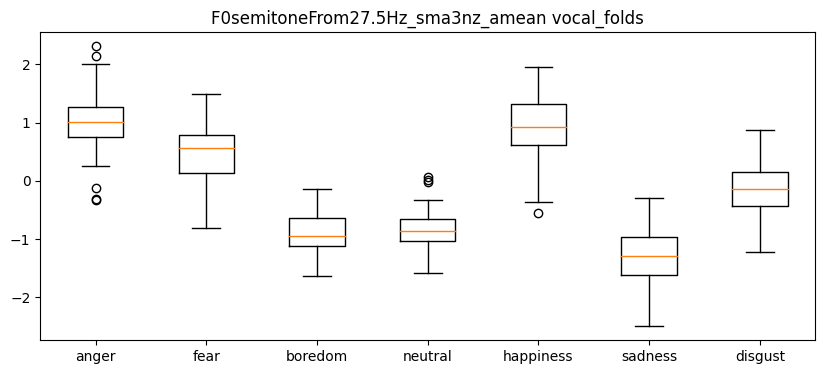

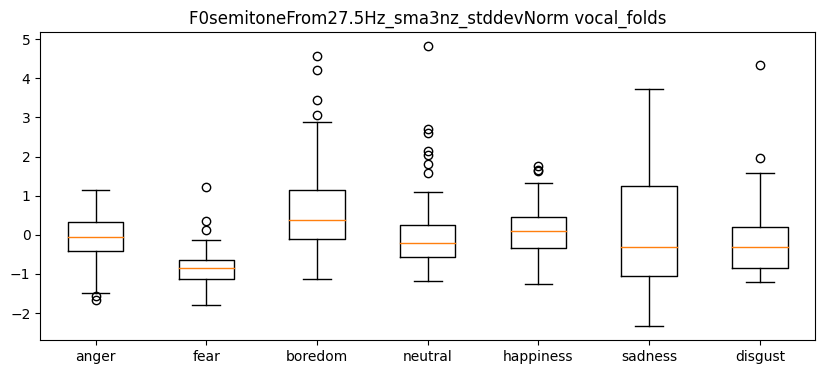

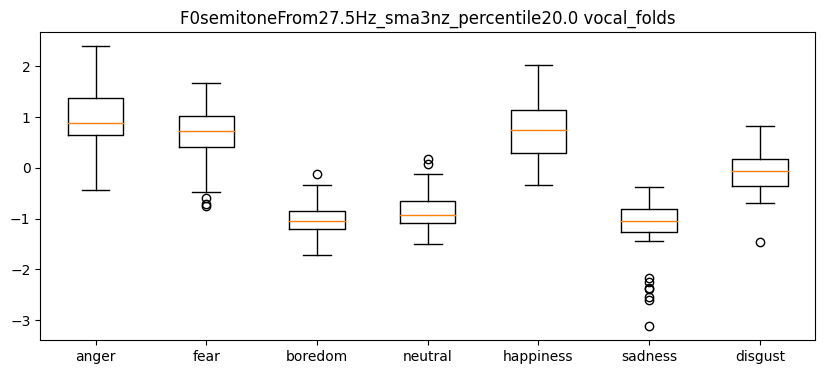

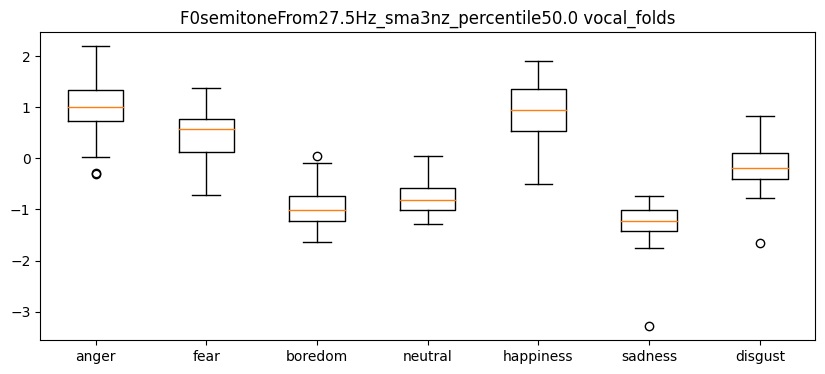

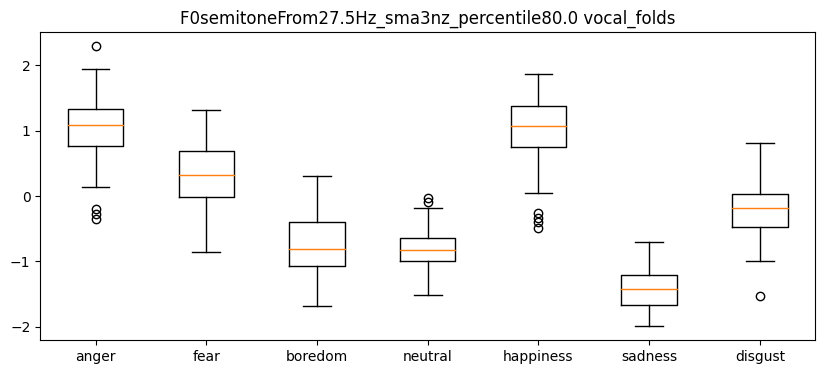

...

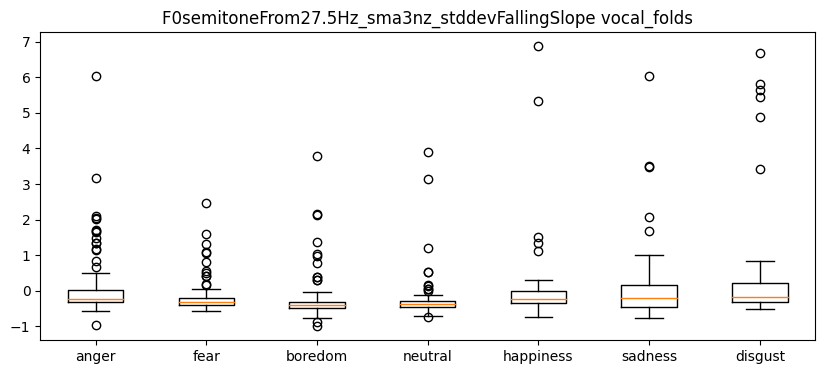

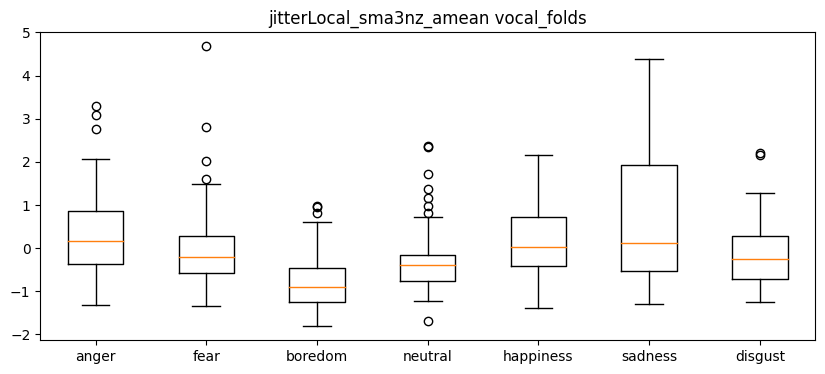

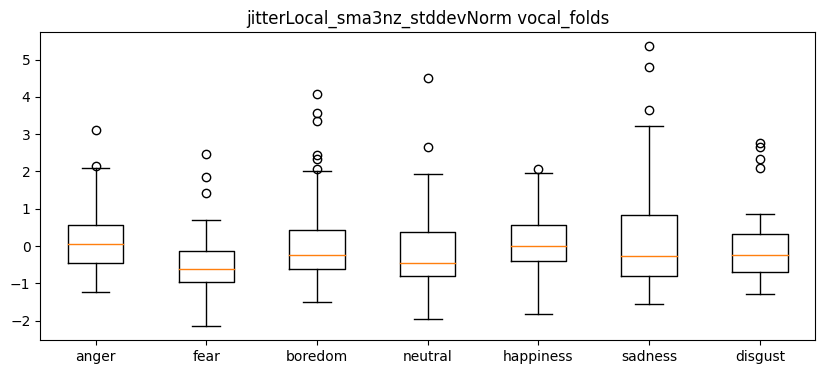

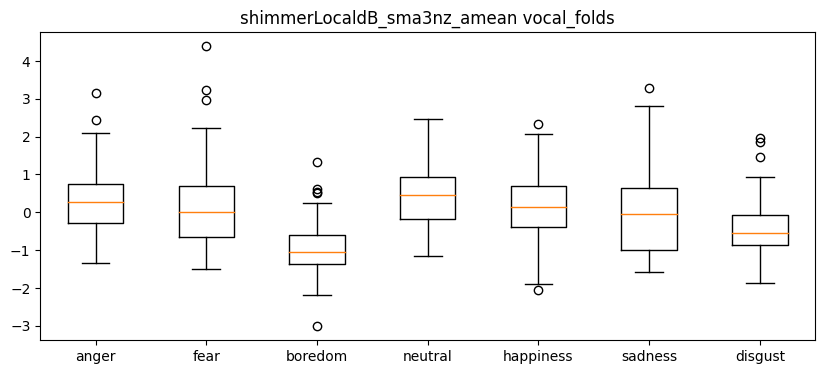

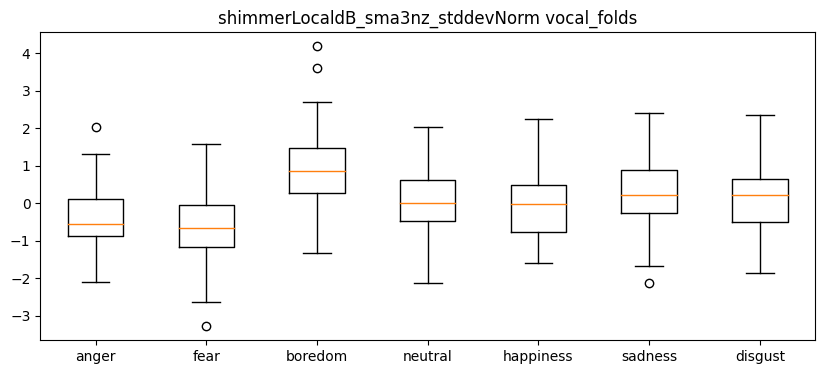

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='dodgerblue':
    descriptive_box_plot(i)

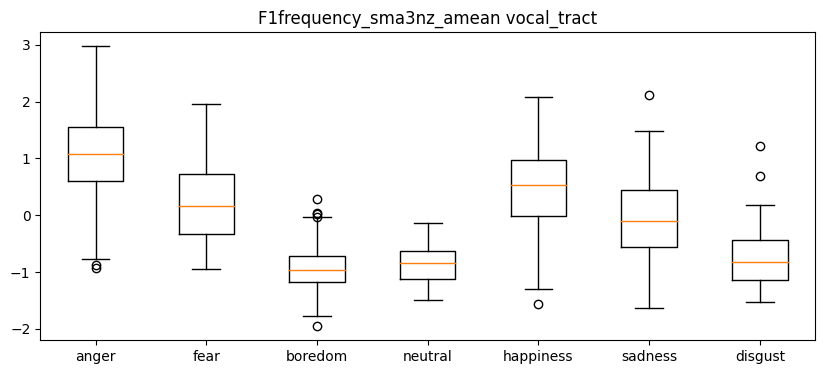

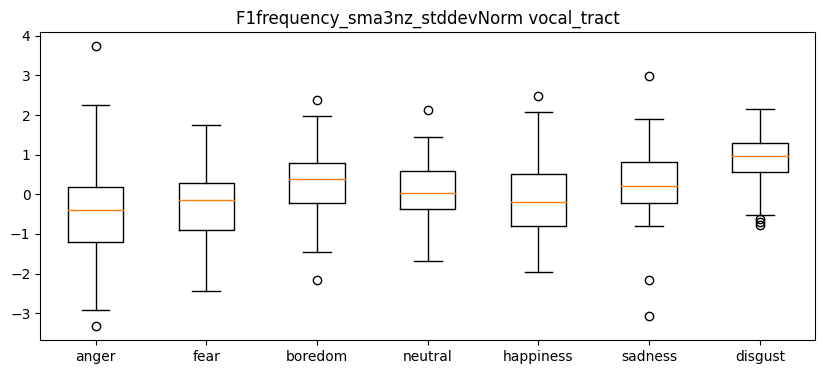

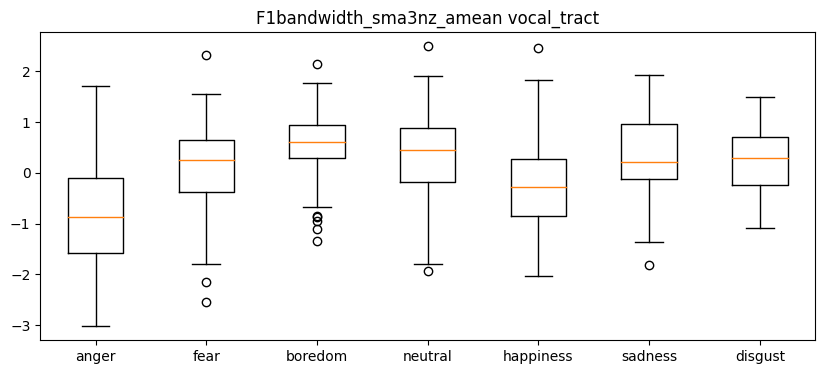

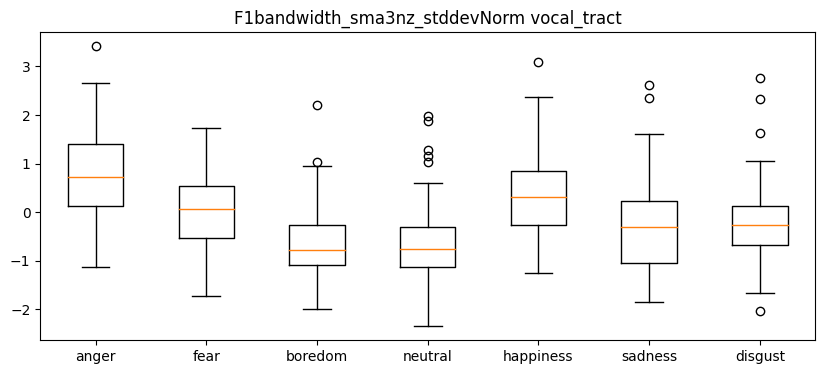

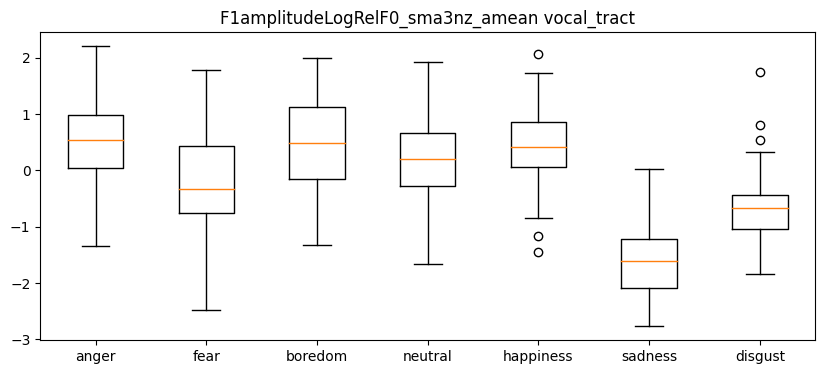

...

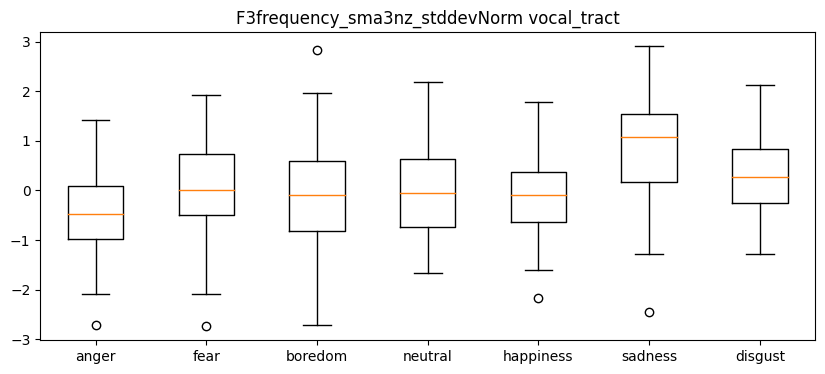

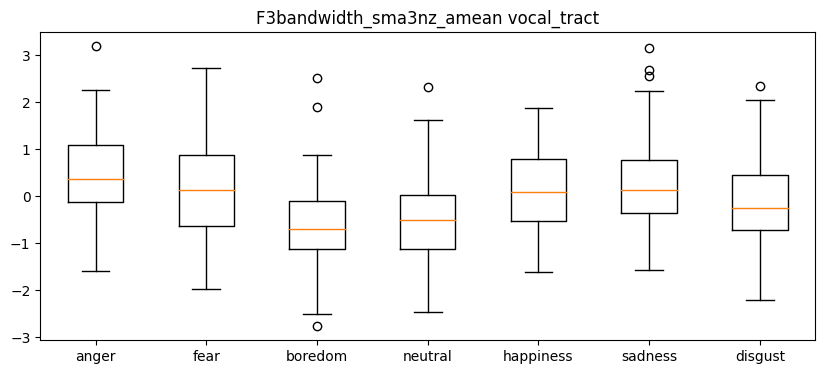

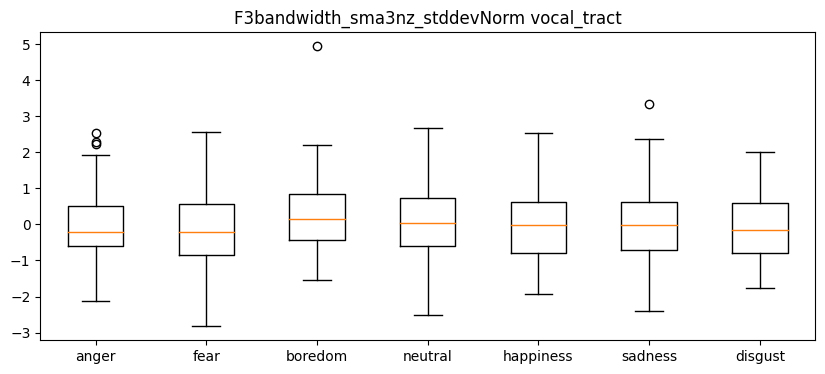

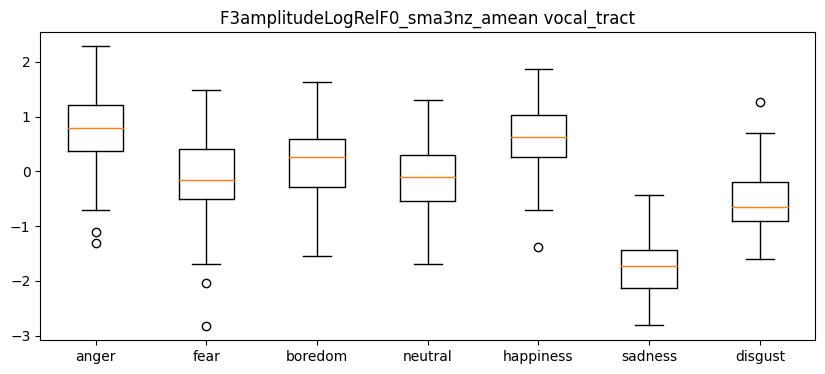

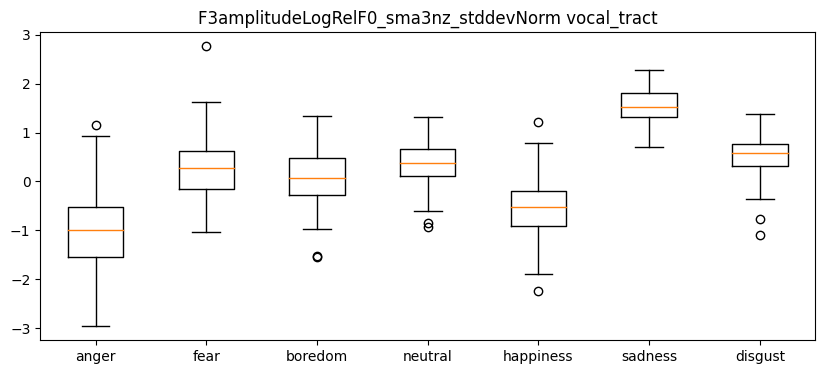

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='crimson':
    descriptive_box_plot(i)

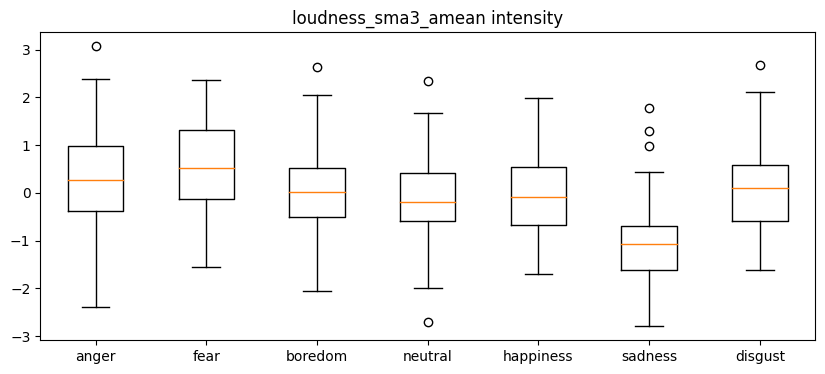

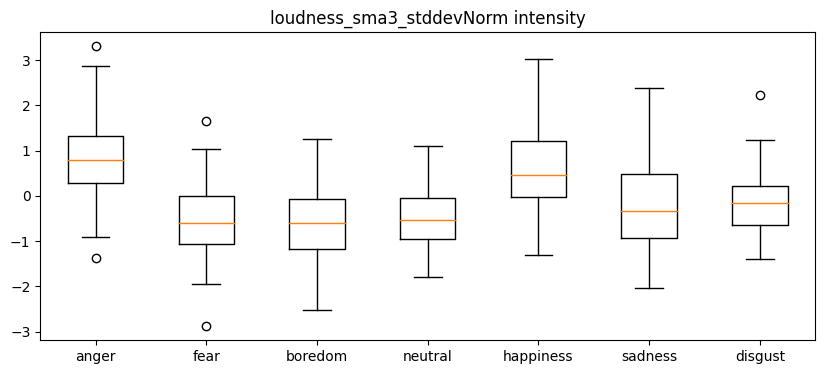

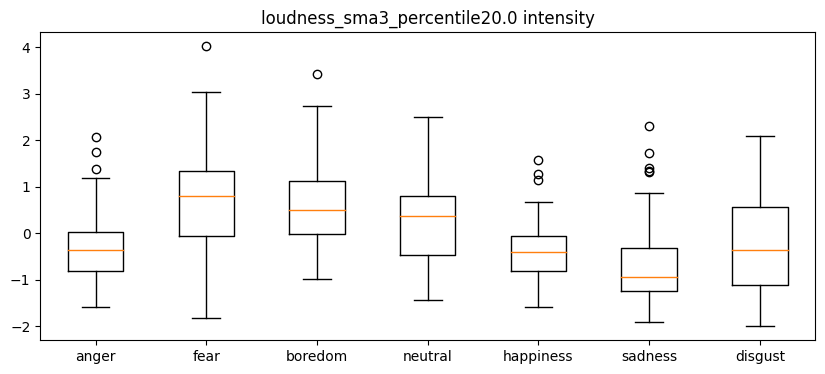

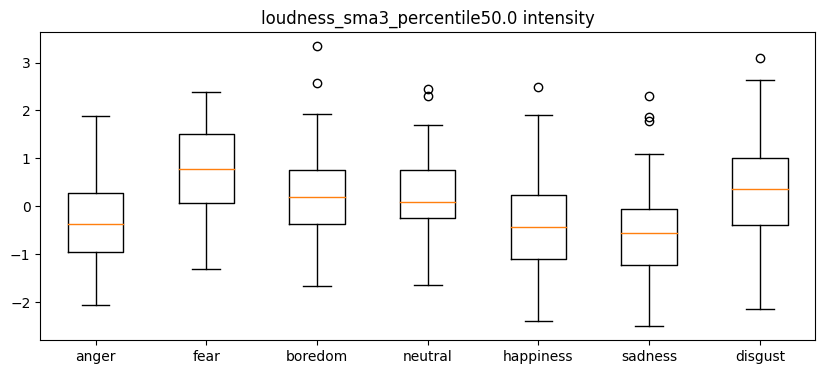

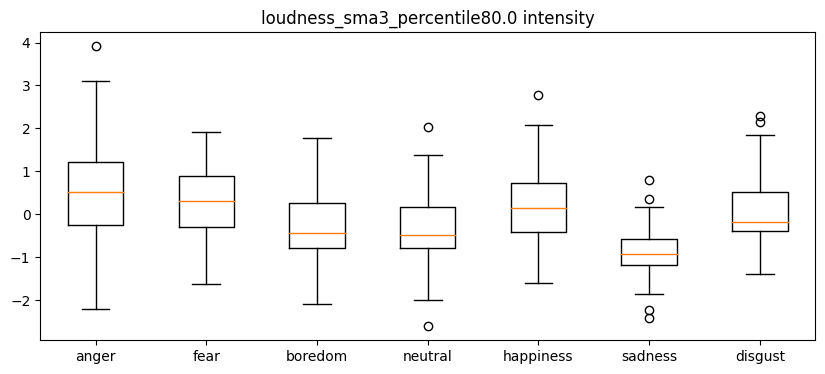

...

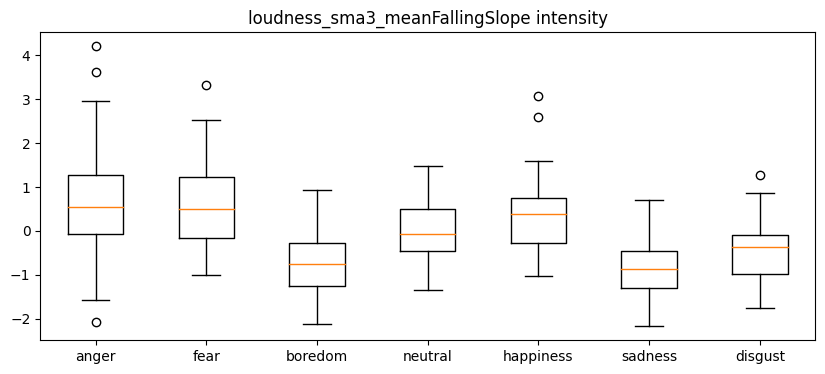

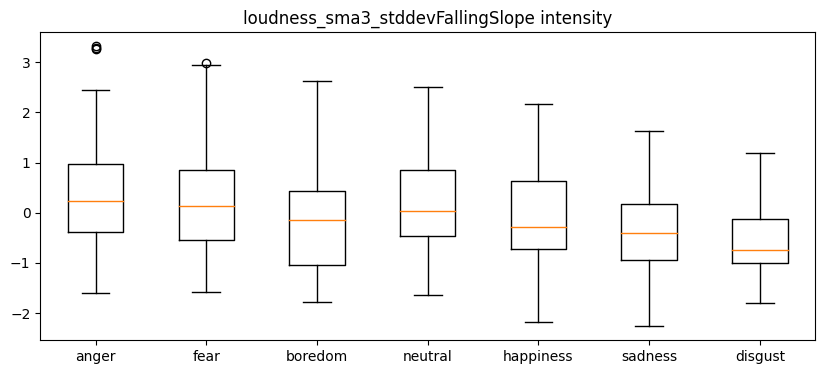

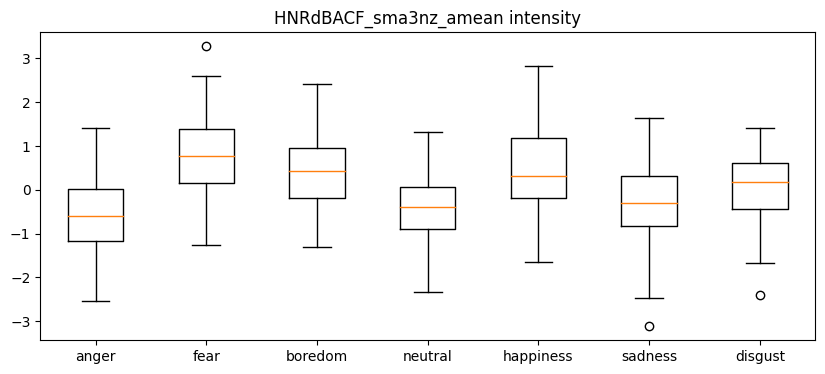

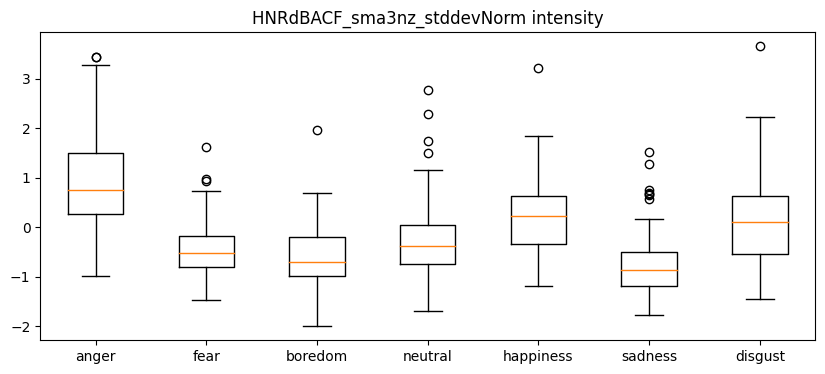

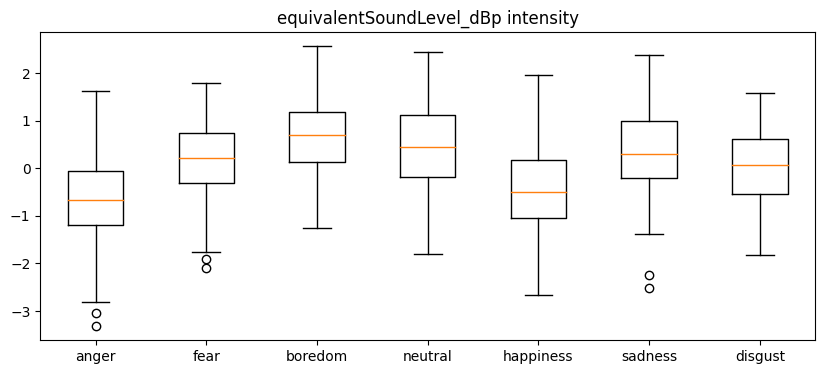

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='limegreen':
    descriptive_box_plot(i)

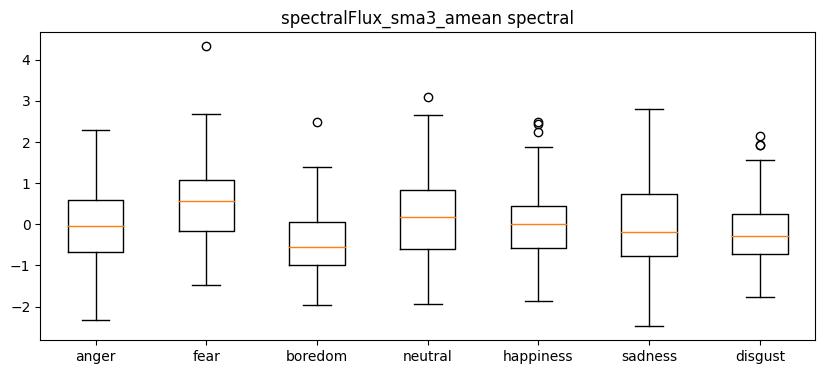

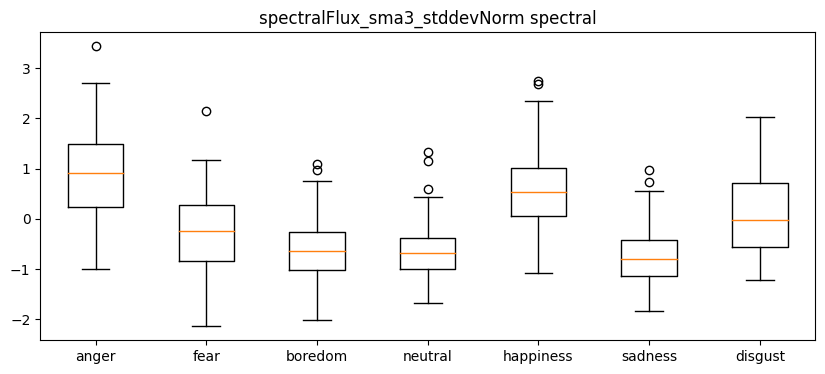

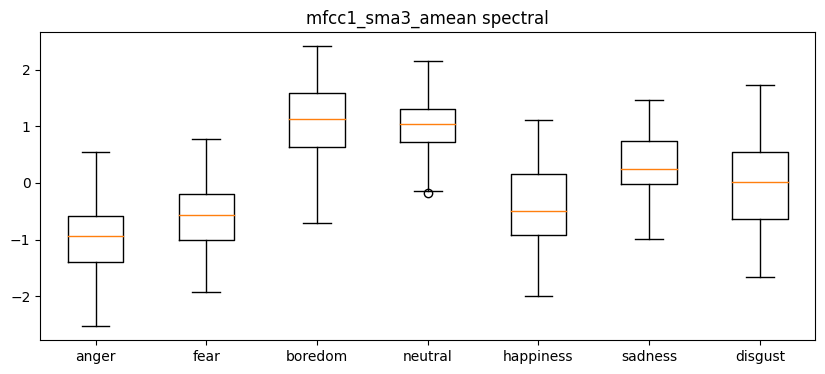

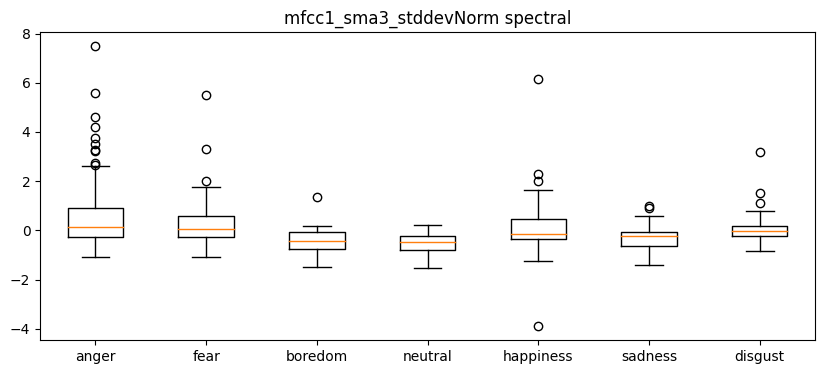

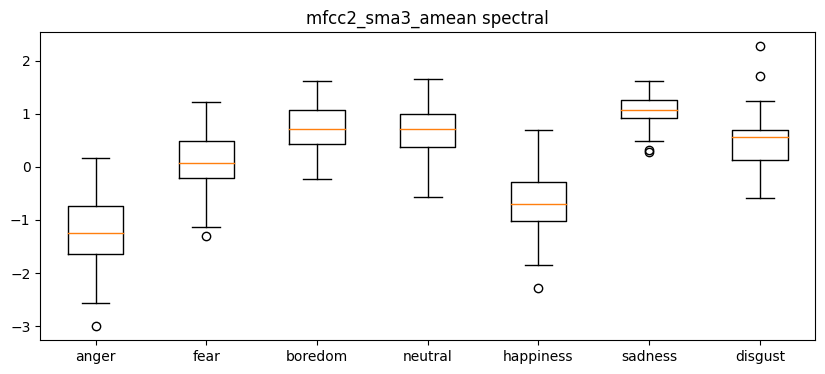

...

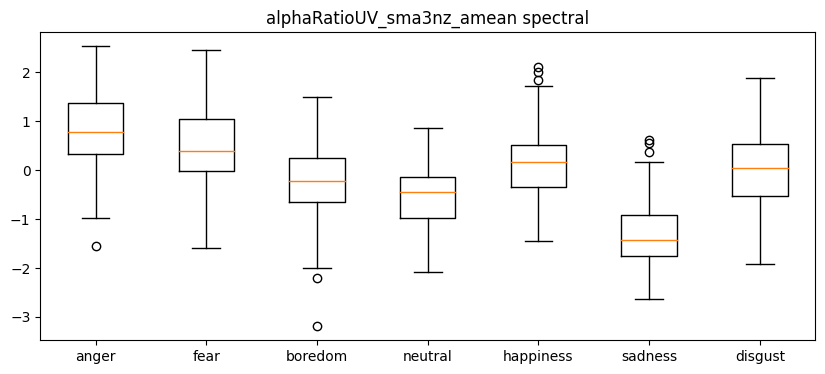

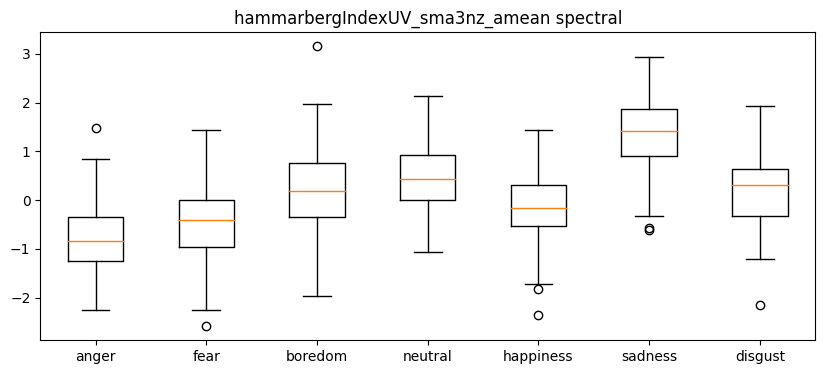

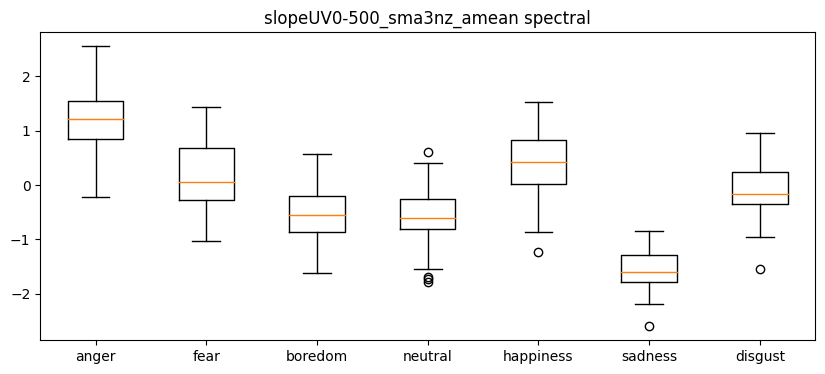

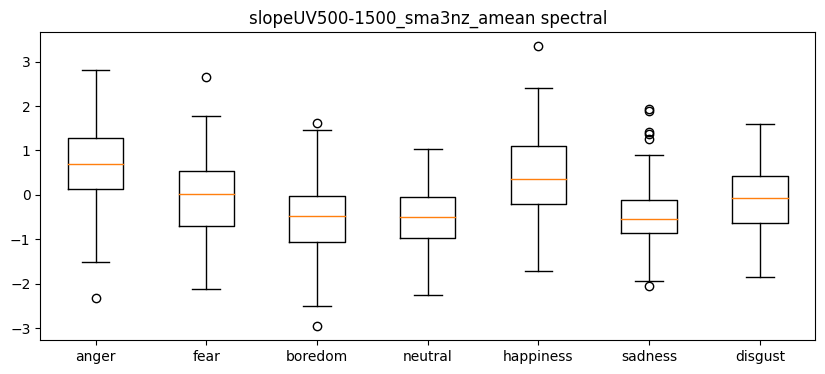

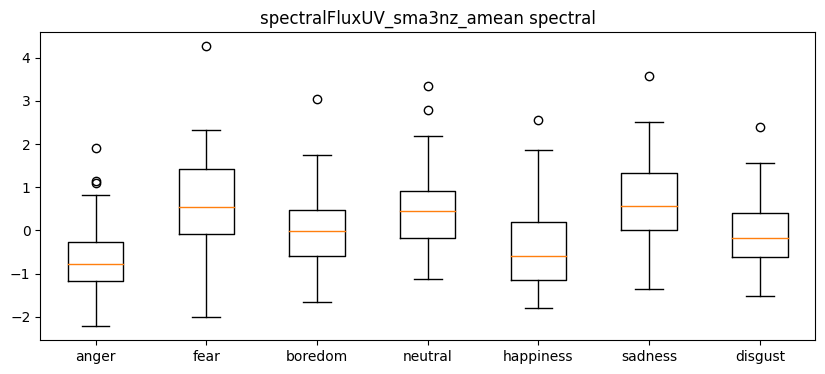

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='darkviolet':
    descriptive_box_plot(i)

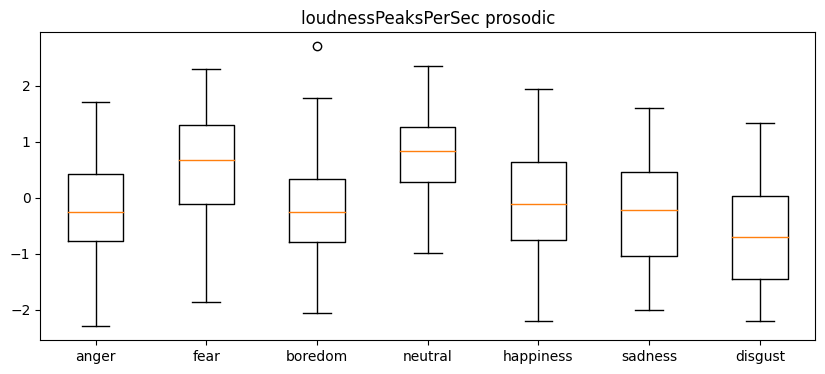

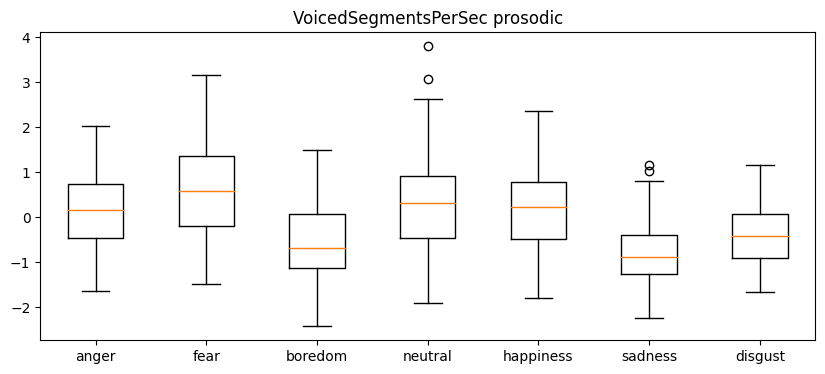

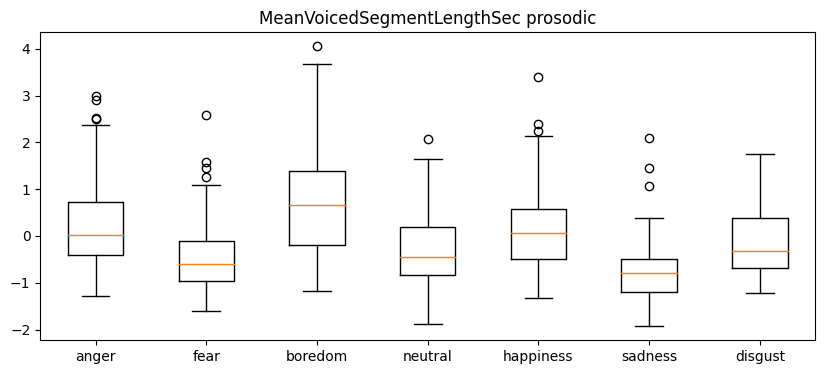

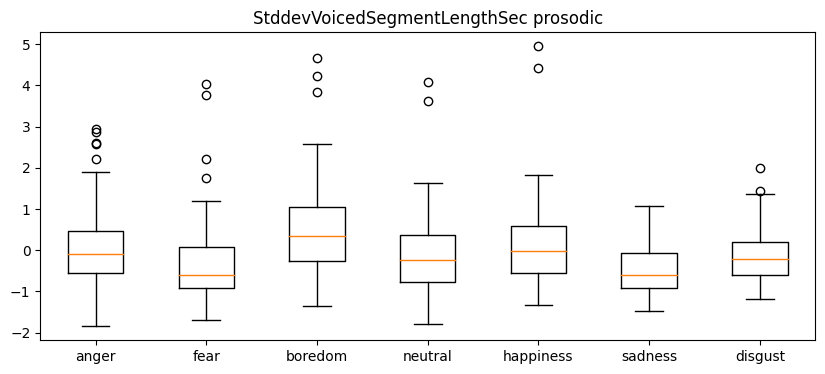

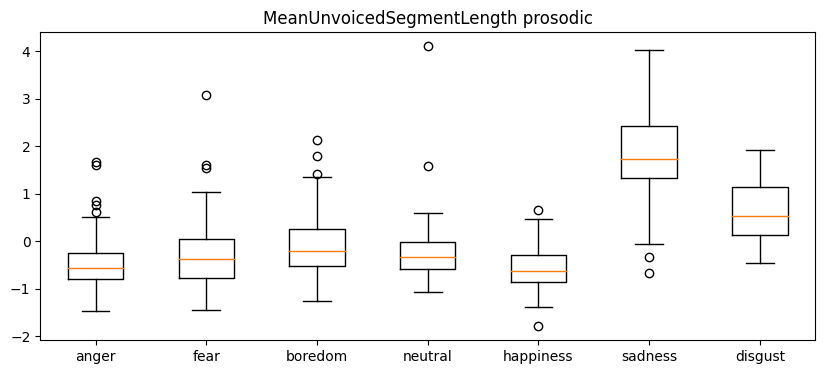

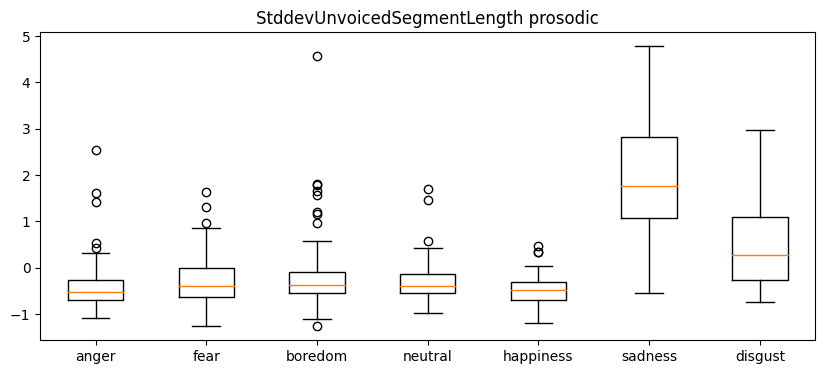

In [ ]:
for i in range(88):
  if egemaps_category_dict[egemaps_feature_names[i]]=='slategrey':
    descriptive_box_plot(i)

### Effect size

In [ ]:
def effectsize(dist1, dist2):
  mean1, mean2 = np.mean(dist1), np.mean(dist2)
  std1, std2 = np.std(dist1, ddof=1), np.std(dist2, ddof=1)
  pooled_std = np.sqrt(((len(dist1)-1)*std1**2 + (len(dist2)-1)*std2**2) / (len(dist1) + len(dist2) - 2))
  cohens_d = (mean2 - mean1) / pooled_std
  return cohens_d


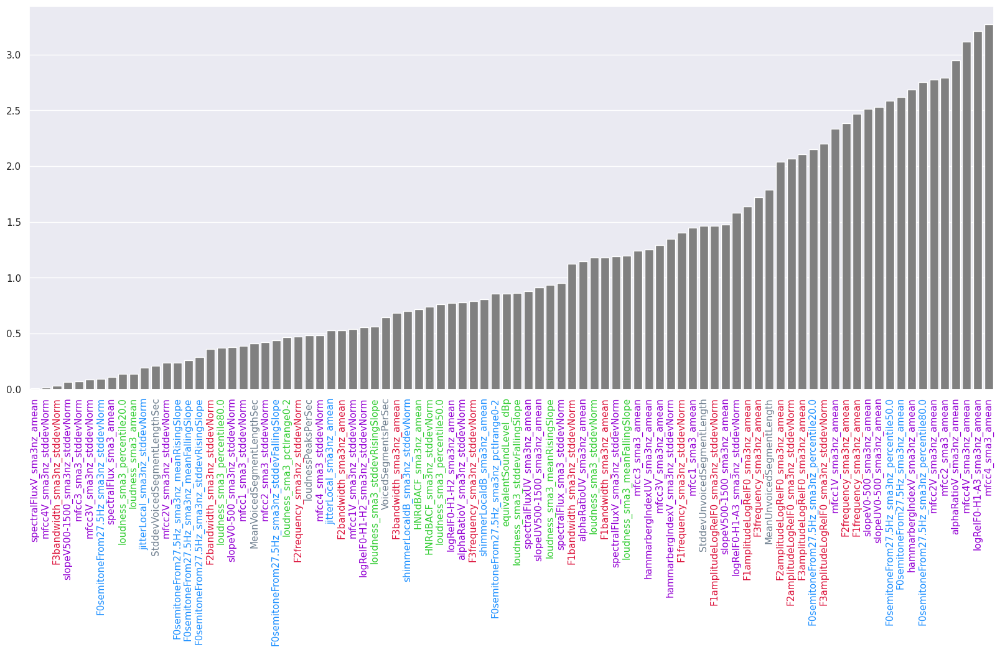

In [ ]:
from scipy import stats

anger_neutral_effect_size_list = []
for i in range(88):
  anger_neutral_effect_size_list.append(abs(effectsize(anger_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=anger_neutral_effect_size_list, sort=True)

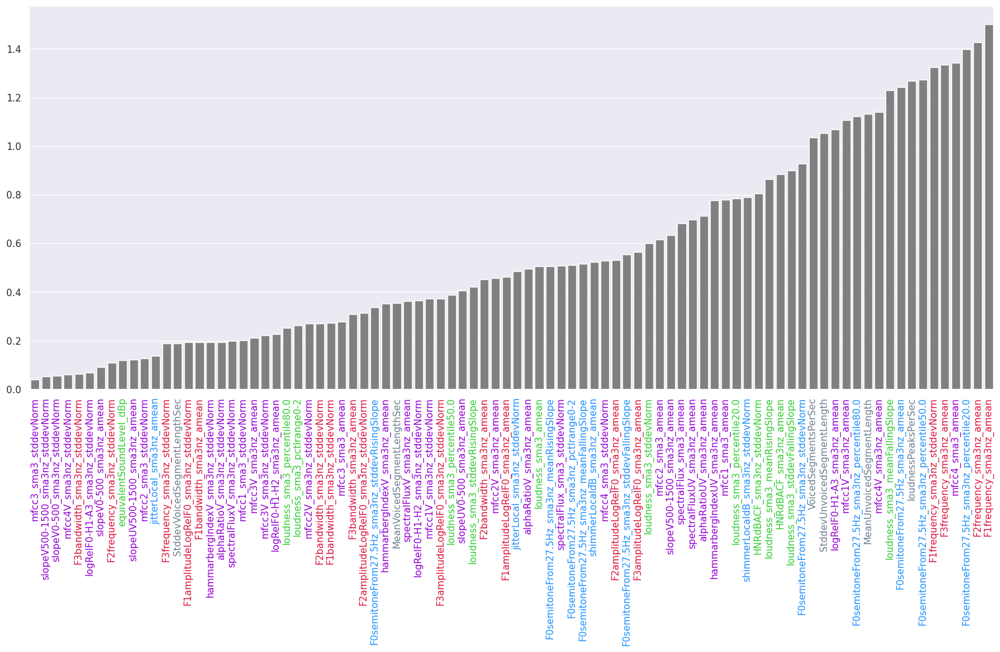

In [ ]:
bored_neutral_effect_size_list = []
for i in range(88):
  bored_neutral_effect_size_list.append(abs(effectsize(bored_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=bored_neutral_effect_size_list, sort=True)

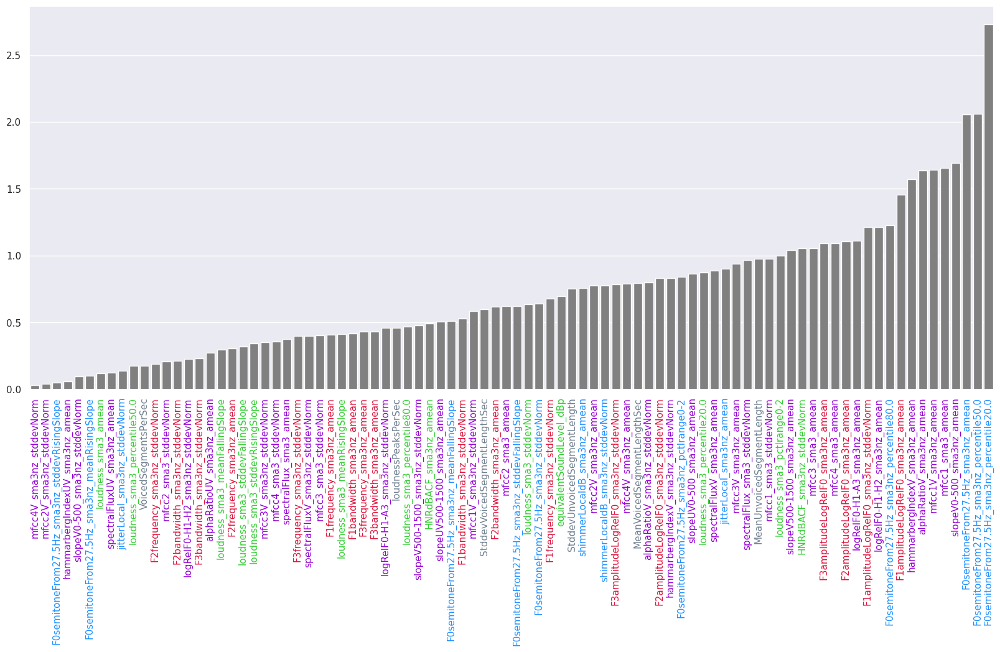

In [ ]:
disgust_neutral_effect_size_list = []
for i in range(88):
  disgust_neutral_effect_size_list.append(abs(effectsize(disgust_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=disgust_neutral_effect_size_list, sort=True)

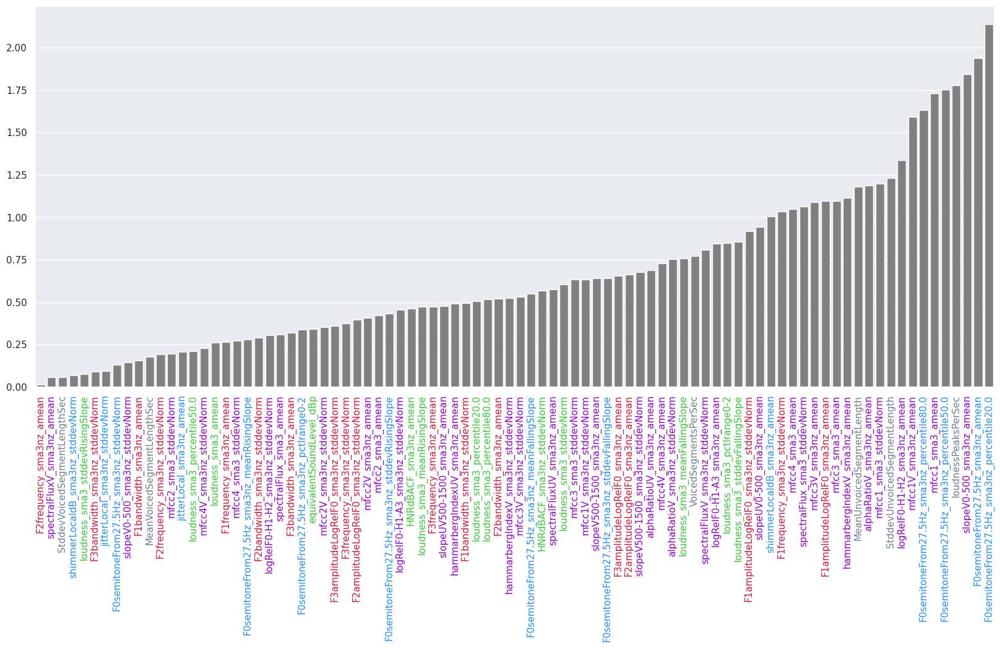

In [ ]:
fear_neutral_effect_size_list = []
for i in range(88):
  fear_neutral_effect_size_list.append(abs(effectsize(fear_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=fear_neutral_effect_size_list, sort=True)

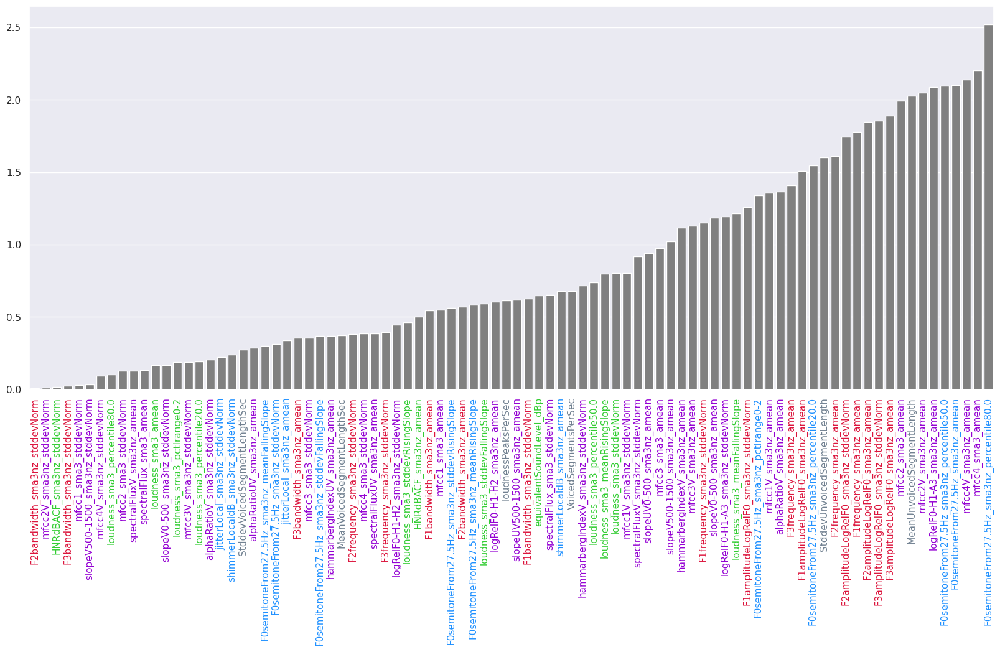

In [ ]:
happy_neutral_effect_size_list = []
for i in range(88):
  happy_neutral_effect_size_list.append(abs(effectsize(happy_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=happy_neutral_effect_size_list, sort=True)

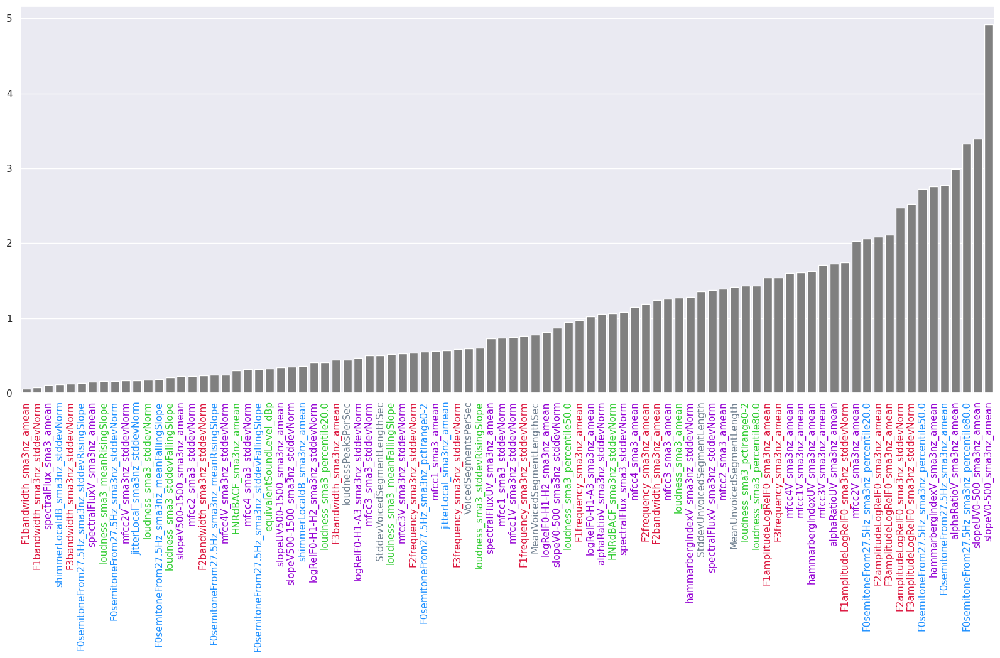

In [ ]:
sad_neutral_effect_size_list = []
for i in range(88):
  sad_neutral_effect_size_list.append(abs(effectsize(sad_embeddings[:,i].numpy(), neutral_embeddings[:, i].numpy())))

color_bar_plot(y=sad_neutral_effect_size_list, sort=True)